In [1]:
!pip install warmup_scheduler
!pip install pylibjpeg==2.0
!pip install pylibjpeg-libjpeg==2.1
!pip install pylibjpeg pylibjpeg-libjpeg pylibjpeg-openjpeg
!pip install python-gdcm





In [2]:
import sys; 
import ast
from glob import glob
import cv2
from skimage import io
import os
from datetime import datetime
import time
import random
from tqdm import tqdm
from contextlib import contextmanager
import math

import numpy as np
import pandas as pd
import sklearn
from sklearn.metrics import roc_auc_score, log_loss
from sklearn import metrics
from sklearn.model_selection import GroupKFold, StratifiedKFold, KFold
import torch
import torchvision
from torchvision import transforms
from torch import nn
from torch.utils.data import Dataset,DataLoader
from torch.utils.data.sampler import SequentialSampler, RandomSampler
from torch.nn.modules.loss import _WeightedLoss
import torch.nn.functional as F
import matplotlib.pyplot as plt

from torch.optim import Adam, SGD, AdamW
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts, CosineAnnealingLR, ReduceLROnPlateau
from warmup_scheduler import GradualWarmupScheduler
import timm
import warnings
import joblib
from scipy.ndimage.interpolation import zoom
import nibabel as nib
import pydicom as dicom

<ipython-input-2-1097431b3a5f>:36: DeprecationWarning: Please import `zoom` from the `scipy.ndimage` namespace; the `scipy.ndimage.interpolation` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.interpolation import zoom


In [3]:
datadir = '/kaggle/input/rsna-2022-cervical-spine-fracture-detection'
segmentation_dir = os.path.join(datadir, 'segmentations')


In [4]:
seg_paths = glob(f"{segmentation_dir}/*")
print(f"Number of segmentation files: {len(seg_paths)}")

if len(seg_paths) > 0:
    print("Sample paths:", seg_paths[:3])

seg_df = pd.DataFrame({'path': seg_paths})
seg_df['StudyInstanceUID'] = seg_df['path'].apply(lambda x:x.split('/')[-1][:-4])
seg_df = seg_df[['StudyInstanceUID','path']]
print('seg_df shape:', seg_df.shape)
seg_df.head(3)

Number of segmentation files: 87
Sample paths: ['/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.780.nii', '/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.21321.nii', '/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.6125.nii']
seg_df shape: (87, 2)


,StudyInstanceUID,path
0,1.2.826.0.1.3680043.780,/kaggle/input/rsna-2022-cervical-spine-fractur...
1,1.2.826.0.1.3680043.21321,/kaggle/input/rsna-2022-cervical-spine-fractur...
2,1.2.826.0.1.3680043.6125,/kaggle/input/rsna-2022-cervical-spine-fractur...


In [5]:
import pydicom
from pydicom.pixel_data_handlers import gdcm_handler

def load_dicom(path):
    """
    Load a DICOM file, normalize the pixel data, and ensure compatibility with YBR_FULL.
    """
    # Read the DICOM file
    img = dicom.dcmread(path)

    # Access the pixel array (before setting PhotometricInterpretation)
    pixel_array = img.pixel_array

    # Normalize and convert to uint8
    data = pixel_array.astype(np.float32)  # Start with float for normalization
    data = data - np.min(data)  # Normalize to 0
    if np.max(data) != 0:
        data = data / np.max(data)  # Normalize to [0, 1]
    data = (data * 255).astype(np.uint8)  # Scale to [0, 255] and convert to uint8

    # Replace the pixel data in the DICOM object
    img.PixelData = data.tobytes()
    img.PhotometricInterpretation = 'YBR_FULL'

    # Return the processed data
    return cv2.cvtColor(data, cv2.COLOR_GRAY2RGB), img


In [6]:
study_uid_list = seg_df["StudyInstanceUID"].tolist()


In [7]:
dataframe_list = []

os.makedirs("kaggle/working/seg_25d_image", exist_ok=True)
os.makedirs("kaggle/working/seg_25d_mask", exist_ok=True)

# excluded_study = ["1.2.826.0.1.3680043.18480","1.2.826.0.1.3680043.23904","1.2.826.0.1.3680043.1542","1.2.826.0.1.3680043.24140"]
limited_study_uid_list = study_uid_list[:30]


for file_name in tqdm(limited_study_uid_list):
    try:
        # if file_name in excluded_study:
        #     continue
        ex_path = f"{datadir}/segmentations/{file_name}.nii"
        print(ex_path)
        mask = nib.load(ex_path)
        mask = mask.get_fdata()  # convert to numpy array
        mask = mask[:, ::-1, ::-1].transpose(1, 0, 2)
        mask = np.clip(mask,0,8).astype(np.uint8)
        mask = np.ascontiguousarray(mask)
    
        train_image_path = glob(f"{datadir}/train_images/{file_name}/*")
        train_image_path = sorted(train_image_path, key=lambda x:int(x.split("/")[-1].replace(".dcm","")))
        image_list = []
        for path in train_image_path:
            
            im, meta = load_dicom(path)
            image_list.append(im[:,:,0])
        image = np.stack(image_list, axis=2)
        
        assert image.shape == mask.shape, f"Image and mask {file_name} should be the same size, but are {image.shape} and {mask.shape}"
        slice_num = image.shape[2]
    
        for i in range(1, slice_num-1):
            image_25d = image[:,:, i-1:i+2]
            mask_25d = mask[:,:, i-1:i+2]
            assert image_25d.shape == mask_25d.shape == (512, 512, 3), f"Image and mask {file_name} should be (512, 512, 3), but are {image_25d.shape} and {mask_25d.shape}"
            image_save_path = f"kaggle/working/seg_25d_image/{file_name}_{i}.npy"
            mask_save_path =  f"kaggle/working/seg_25d_mask/{file_name}_{i}.npy"
            np.save(image_save_path, image_25d)
            np.save(mask_save_path, mask_25d)
            dataframe_list.append([f"{file_name}_{i}", file_name, i, image_save_path, mask_save_path])
    except:
        continue

  0%|          | 0/30 [00:00<?, ?it/s]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.780.nii


  3%|▎         | 1/30 [00:10<05:11, 10.74s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.21321.nii


  7%|▋         | 2/30 [01:10<18:31, 39.69s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.6125.nii


 10%|█         | 3/30 [01:20<11:40, 25.94s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.30067.nii


 13%|█▎        | 4/30 [01:32<08:57, 20.68s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.12833.nii


 17%|█▋        | 5/30 [01:47<07:44, 18.59s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.10921.nii


 20%|██        | 6/30 [02:08<07:45, 19.40s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.30524.nii


 23%|██▎       | 7/30 [02:22<06:42, 17.49s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.14267.nii


 27%|██▋       | 8/30 [03:06<09:32, 26.02s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.27292.nii


 30%|███       | 9/30 [03:22<08:00, 22.90s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.20647.nii


 33%|███▎      | 10/30 [03:38<06:56, 20.82s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.32436.nii


 37%|███▋      | 11/30 [03:57<06:21, 20.10s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.30640.nii


 40%|████      | 12/30 [04:13<05:40, 18.90s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.18480.nii


 43%|████▎     | 13/30 [05:03<08:01, 28.34s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.26110.nii


 47%|████▋     | 14/30 [05:43<08:31, 31.98s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.3168.nii


 50%|█████     | 15/30 [05:53<06:20, 25.38s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.32280.nii


 53%|█████▎    | 16/30 [06:13<05:30, 23.64s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.23904.nii


 57%|█████▋    | 17/30 [06:58<06:30, 30.06s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.26068.nii


 60%|██████    | 18/30 [08:01<08:00, 40.02s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.18906.nii


 63%|██████▎   | 19/30 [08:28<06:37, 36.13s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.24606.nii


 67%|██████▋   | 20/30 [08:43<04:57, 29.73s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.28665.nii


 70%|███████   | 21/30 [08:58<03:46, 25.21s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.1542.nii


 73%|███████▎  | 22/30 [09:44<04:12, 31.53s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.24140.nii


 77%|███████▋  | 23/30 [10:04<03:15, 27.94s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.8330.nii


 80%|████████  | 24/30 [10:30<02:45, 27.60s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.4769.nii


 83%|████████▎ | 25/30 [10:50<02:05, 25.13s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.12281.nii


 87%|████████▋ | 26/30 [11:14<01:39, 24.90s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.5002.nii


 90%|█████████ | 27/30 [11:50<01:24, 28.16s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.4202.nii


 93%|█████████▎| 28/30 [12:10<00:51, 25.61s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.6078.nii


 97%|█████████▋| 29/30 [12:27<00:23, 23.04s/it]

/kaggle/input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.24617.nii


100%|██████████| 30/30 [13:25<00:00, 26.87s/it]


In [8]:
# this cell is for loading the saved output
import os
import pandas as pd

dataframe_list = []
seg_image_folder = "kaggle/working/seg_25d_image"
seg_mask_folder = "kaggle/working/seg_25d_mask"

# List all saved files
image_files = sorted(os.listdir(seg_image_folder))
mask_files = sorted(os.listdir(seg_mask_folder))

# Rebuild dataframe_list
for image_file, mask_file in zip(image_files, mask_files):
    file_name, slice_num = image_file.replace(".npy", "").rsplit("_", 1)
    image_save_path = os.path.join(seg_image_folder, image_file)
    mask_save_path = os.path.join(seg_mask_folder, mask_file)
    dataframe_list.append([f"{file_name}_{slice_num}", file_name, int(slice_num), image_save_path, mask_save_path])

# Convert to DataFrame (if needed)
columns = ["id", "file_name", "slice_num", "image_path", "mask_path"]
df = pd.DataFrame(dataframe_list, columns=columns)


In [9]:
seg_25d_df = pd.DataFrame(dataframe_list, columns=["id", "StudyInstanceUID", "slice_num", "image_path", "mask_path"])
seg_25d_df["fold"] = -1

gkf = GroupKFold(n_splits=5)
for idx, (train_index, test_index) in enumerate(gkf.split(X=seg_25d_df, groups=seg_25d_df['StudyInstanceUID'].values)):
    seg_25d_df.loc[test_index, 'fold'] = idx

In [10]:
for i in range(5):
    study_num = len(np.unique(seg_25d_df[seg_25d_df["fold"] == i]["StudyInstanceUID"]))
    print(f"fold{i} num: {study_num}")

fold0 num: 6
fold1 num: 6
fold2 num: 6
fold3 num: 6
fold4 num: 6


In [11]:
os.makedirs("kaggle/working/seg_25d_csv", exist_ok=True)

seg_25d_df.to_csv(f"kaggle/working/seg_25d_csv/seg_25d.csv", index=False)
df_loaded = pd.read_csv("kaggle/working/seg_25d_csv/seg_25d.csv")
print(df_loaded)  # Show the first 5 rows


                                 id           StudyInstanceUID  slice_num  \
0       1.2.826.0.1.3680043.10921_1  1.2.826.0.1.3680043.10921          1   
1      1.2.826.0.1.3680043.10921_10  1.2.826.0.1.3680043.10921         10   
2     1.2.826.0.1.3680043.10921_100  1.2.826.0.1.3680043.10921        100   
3     1.2.826.0.1.3680043.10921_101  1.2.826.0.1.3680043.10921        101   
4     1.2.826.0.1.3680043.10921_102  1.2.826.0.1.3680043.10921        102   
...                             ...                        ...        ...   
9862    1.2.826.0.1.3680043.8330_95   1.2.826.0.1.3680043.8330         95   
9863    1.2.826.0.1.3680043.8330_96   1.2.826.0.1.3680043.8330         96   
9864    1.2.826.0.1.3680043.8330_97   1.2.826.0.1.3680043.8330         97   
9865    1.2.826.0.1.3680043.8330_98   1.2.826.0.1.3680043.8330         98   
9866    1.2.826.0.1.3680043.8330_99   1.2.826.0.1.3680043.8330         99   

                                             image_path  \
0     kaggle/wor

In [12]:
train_bs_=16
valid_bs_=32
num_workers_=4

In [13]:
class CFG:
    seed=42
    device='GPU'
    nprocs=1 
    num_workers=num_workers_
    train_bs=train_bs_
    valid_bs=valid_bs_
    fold_num=5 
    
    target_cols=["C1", "C2", "C3", "C4", "C5", "C6", "C7", "OT"]
    num_classes=8 
    
    accum_iter=1 
    max_grad_norm=1000 
    print_freq=100 
    normalize_mean=[0.4824, 0.4824, 0.4824] 
    normalize_std=[0.22, 0.22, 0.22] 
    
    suffix="109" 
    fold_list=[0] 
    epochs=15
    model_arch="efficientnet-b0"
    img_size=320 
    optimizer="AdamW" 
    scheduler="CosineAnnealingLR"
    loss_fn="BCEWithLogitsLoss"
    scheduler_warmup= "GradualWarmupSchedulerV3"

    warmup_epo=1
    warmup_factor = 10
    T_max= epochs-warmup_epo-2 if scheduler_warmup=="GradualWarmupSchedulerV2" else \
           epochs-warmup_epo-1 if scheduler_warmup=="GradualWarmupSchedulerV3" else epochs-1
   
    lr=5e-3 
    min_lr=1e-6 #
    weight_decay=0 
    
    n_early_stopping=5



In [14]:
train_df = pd.read_csv("kaggle/working/seg_25d_csv/seg_25d.csv")
print('train_df shape:', train_df.shape)
train_df.head(3)

train_df shape: (9867, 6)


,id,StudyInstanceUID,slice_num,image_path,mask_path,fold
0,1.2.826.0.1.3680043.10921_1,1.2.826.0.1.3680043.10921,1,kaggle/working/seg_25d_image/1.2.826.0.1.36800...,kaggle/working/seg_25d_mask/1.2.826.0.1.368004...,3
1,1.2.826.0.1.3680043.10921_10,1.2.826.0.1.3680043.10921,10,kaggle/working/seg_25d_image/1.2.826.0.1.36800...,kaggle/working/seg_25d_mask/1.2.826.0.1.368004...,3
2,1.2.826.0.1.3680043.10921_100,1.2.826.0.1.3680043.10921,100,kaggle/working/seg_25d_image/1.2.826.0.1.36800...,kaggle/working/seg_25d_mask/1.2.826.0.1.368004...,3


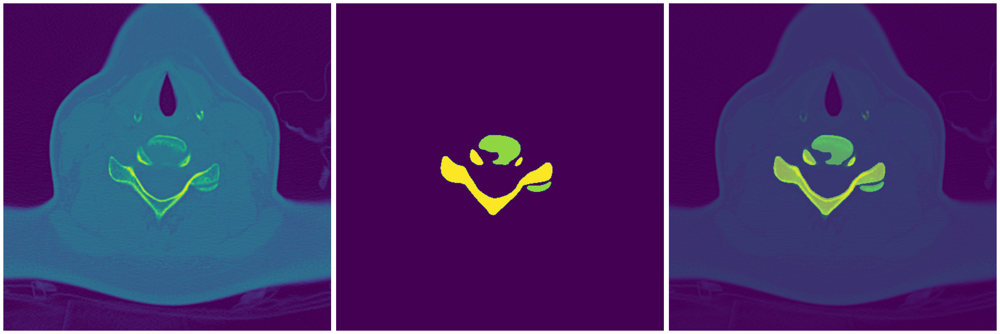

In [15]:
example_name = "1.2.826.0.1.3680043.780_147"
image_example = np.load(f"kaggle/working/seg_25d_image/{example_name}.npy").transpose(2,0,1)
mask_example = np.load(f"kaggle/working/seg_25d_mask/{example_name}.npy").transpose(2,0,1)
plt.figure(figsize=(30, 20))
plt.subplot(1, 3, 1); plt.imshow(image_example[1]); plt.axis('OFF');
plt.subplot(1, 3, 2); plt.imshow(mask_example[1]); plt.axis('OFF');
plt.subplot(1, 3, 3); plt.imshow(image_example[1]); plt.imshow(mask_example[1],alpha=0.5); plt.axis('OFF');
# plt.colorbar()
plt.tight_layout()
plt.show()

In [16]:
def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True 

seed_everything(CFG.seed)


def get_score(y_true, y_pred):
    scores = []
    for i in range(y_true.shape[1]):
        score = roc_auc_score(y_true[:,i], y_pred[:,i])
        scores.append(score)
    avg_score = np.mean(scores)
    return avg_score, scores



def get_result(result_df):
    preds = result_df[[f'pred_{c}' for c in CFG.target_cols]].values
    labels = result_df[CFG.target_cols].values
    score, scores = get_score(labels, preds)


def get_timediff(time1,time2):
    minute_,second_ = divmod(time2-time1,60)
    return f"{int(minute_):02d}:{int(second_):02d}"  


class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count



def get_img(path):
    im_bgr = cv2.imread(path)
    im_rgb = im_bgr[:, :, ::-1]
    return im_rgb


def load_dicom(path):
    """
    This supports loading both regular and compressed JPEG images. 
    See the first sell with `pip install` commands for the necessary dependencies
    """
    img = dicom.dcmread(path)
    img.PhotometricInterpretation = 'YBR_FULL'
    pixel_array = img.pixel_array
    data=pixel_array.astype(np.uint8)   
    data = data - np.min(data)
    if np.max(data) != 0:
        data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
    return cv2.cvtColor(data, cv2.COLOR_GRAY2RGB), img

In [17]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [18]:
class TrainDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.file_names = df['id'].values
        self.transform = transform
        
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        file_name = self.file_names[idx]
        image = np.load(f"kaggle/working/seg_25d_image/{file_name}.npy") # 512 * 512 * 3
        mask = np.load(f"kaggle/working/seg_25d_mask/{file_name}.npy") # 512 * 512 * 3

        # transform
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']
        
        image = image/255.0


        real_mask = np.zeros([CFG.num_classes, CFG.img_size, CFG.img_size])  # 8 * img_size * img_size
        for idx in range(CFG.num_classes):
            mask_bool = (mask[:,:,1] == (idx+1))
            real_mask[idx] = mask_bool 
        
        image = np.transpose(image, (2, 0, 1)) # 3 * img_size * img_size
        mask = np.transpose(mask, (2, 0, 1)) # 3 * img_size * img_size

        return torch.from_numpy(image), torch.from_numpy(real_mask), torch.from_numpy(mask)

In [19]:
from albumentations import (
    HorizontalFlip, VerticalFlip, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue,
     GaussNoise, MotionBlur, MedianBlur, RandomResizedCrop,
     RandomBrightnessContrast, Flip, OneOf, Compose, Normalize, CoarseDropout, ShiftScaleRotate, 
    CenterCrop, Resize, RandomCrop, GaussianBlur, Downscale, ElasticTransform
)
import albumentations

from albumentations.pytorch import ToTensorV2

def get_transforms(data):
    if data == 'train':
        return Compose([
            Resize(CFG.img_size, CFG.img_size, interpolation=cv2.INTER_NEAREST),
            HorizontalFlip(p=0.5),
            VerticalFlip(p=0.5),
            ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.05, rotate_limit=10, p=0.5),
            OneOf([
                GridDistortion(num_steps=5, distort_limit=0.05, p=1.0),
                OpticalDistortion(distort_limit=0.05, shift_limit=0.05, p=1.0),
                ElasticTransform(alpha=1, sigma=50, alpha_affine=None, p=1.0)
            ], p=0.25),
            CoarseDropout(max_holes=8, max_height=CFG.img_size[0]//20, max_width=CFG.img_size[1]//20,
                            min_holes=5, fill_value=0, mask_fill_value=0, p=0.5),
            ], p=1.0)

    elif data == 'light_train':
        return Compose([
            Resize(CFG.img_size, CFG.img_size, interpolation=cv2.INTER_NEAREST),
            HorizontalFlip(p=0.5),
            ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.05, rotate_limit=10, p=0.5),
            OneOf([
                GridDistortion(num_steps=5, distort_limit=0.05, p=1.0),
                ElasticTransform(alpha=1, sigma=50, alpha_affine=None, p=1.0)
            ], p=0.25),
            ], p=1.0)

    elif data == 'valid':
        return Compose([
            Resize(CFG.img_size, CFG.img_size, interpolation=cv2.INTER_NEAREST),
        ])

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.24 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


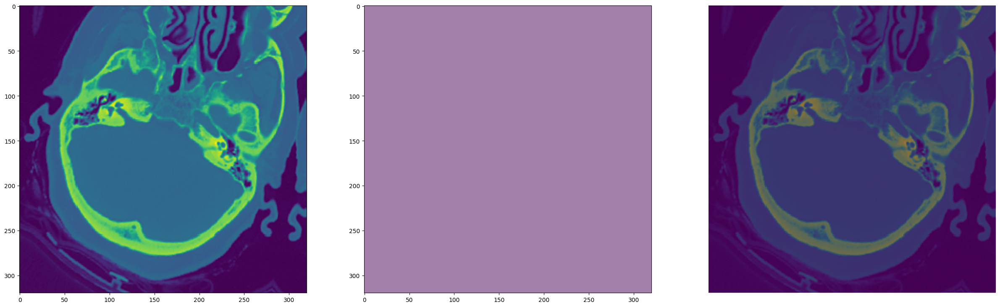

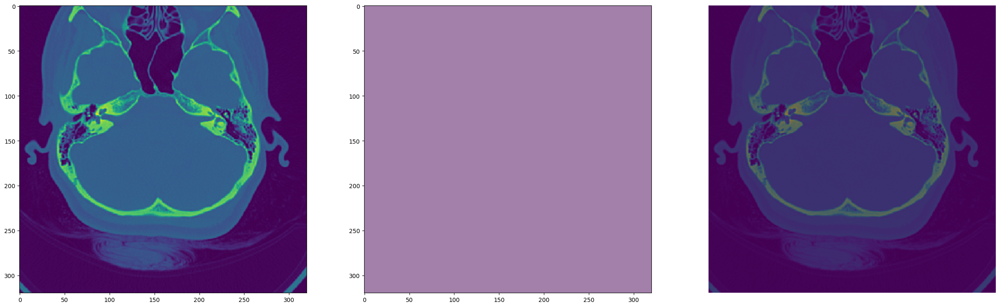

In [20]:
from pylab import rcParams
dataset_show = TrainDataset(
    train_df, 
    get_transforms("light_train") # None, get_transforms("train")
    )
rcParams['figure.figsize'] = 30,20
for i in range(2):
    f, axarr = plt.subplots(1,3)
    idx = np.random.randint(0, len(dataset_show))
    img, mask, raw_mask = dataset_show[idx]
    # axarr[p].imshow(img) # transform=None
    axarr[0].imshow(img[1]); plt.axis('OFF');
    axarr[1].imshow(raw_mask[1]/255, alpha=0.5); plt.axis('OFF');
    axarr[2].imshow(img[1]); axarr[2].imshow(raw_mask[1]/255,alpha=0.5); plt.axis('OFF');

In [21]:
!pip install -U segmentation-models-pytorch
import segmentation_models_pytorch as smp

def build_model():
    model = smp.Unet(
        encoder_name=CFG.model_arch,    # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
        encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
        in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
        classes=CFG.num_classes,        # model output channels (number of classes in your dataset)
        activation=None,
    )
    model.to(device)
    return model

def load_model(path):
    model = build_model()
    model.load_state_dict(torch.load(path))
    model.eval()
    return model

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.5/109.5 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 48.1 MB/s eta 0:00:0000:01
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16425 sha256=31013398b1cfff44b72126c81540c9bd4fac04e7f1aa8ba86d78d237a74d02eb
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60944 sha256=af63abd473cd96546fff07b0b377f914c21249c01c8ce4059076300e8c312872
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientnet-py

In [22]:
JaccardLoss = smp.losses.JaccardLoss(mode='multilabel')
DiceLoss    = smp.losses.DiceLoss(mode='multilabel')
BCELoss     = smp.losses.SoftBCEWithLogitsLoss()
LovaszLoss  = smp.losses.LovaszLoss(mode='multilabel', per_image=False)
TverskyLoss = smp.losses.TverskyLoss(mode='multilabel', log_loss=False)

def dice_coef(y_true, y_pred, thr=0.5, dim=(2,3), epsilon=0.001):
    y_true = y_true.to(torch.float32)
    y_pred = (y_pred>thr).to(torch.float32)
    inter = (y_true*y_pred).sum(dim=dim)
    den = y_true.sum(dim=dim) + y_pred.sum(dim=dim)
    dice = ((2*inter+epsilon)/(den+epsilon)).mean(dim=(1,0))
    return dice

In [23]:
from torch.cuda.amp import GradScaler
from torch.amp import autocast


def train_one_epoch(train_loader, model, criterion, optimizer, epoch, scheduler, device):
    if CFG.device == 'GPU':
        scaler = GradScaler()
    batch_time = AverageMeter()
    data_time = AverageMeter()
    losses = AverageMeter()
    model.train()
    start = end = time.time()
    for step, (images, masks, raw_mask) in enumerate(train_loader):
        # measure data loading time
        data_time.update(time.time() - end)
        images = images.to(device, dtype=torch.float)
        masks = masks.to(device, dtype=torch.float)
        batch_size = images.size(0)

        if CFG.device == 'GPU':
            with autocast(device_type="cuda" if torch.cuda.is_available() else "cpu"):
                y_preds = model(images)
                loss = criterion(y_preds, masks)
            # record loss
            losses.update(loss.item(), batch_size)
            if CFG.accum_iter > 1:
                loss = loss / CFG.accum_iter
            scaler.scale(loss).backward()
            grad_norm = torch.nn.utils.clip_grad_norm_(model.parameters(), CFG.max_grad_norm)
            if (step + 1) % CFG.accum_iter == 0:
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()

        batch_time.update(time.time() - end)
        end = time.time()

    return losses.avg, optimizer.param_groups[0]["lr"]

In [24]:
import gc

def valid_one_epoch(valid_loader, model, criterion, device):
    batch_time = AverageMeter()
    data_time = AverageMeter()
    losses = AverageMeter()
    scores = AverageMeter()
    # switch to evaluation mode
    model.eval()
    start = end = time.time()
    val_scores = []
    for step, (images, masks, raw_mask) in enumerate(valid_loader):
        # measure data loading time
        data_time.update(time.time() - end)
        images = images.to(device, dtype=torch.float)
        masks = masks.to(device, dtype=torch.float)
        batch_size = images.size(0)
        # compute loss
        with torch.no_grad():
            y_pred = model(images)
        loss = criterion(y_pred, masks)
        losses.update(loss.item(), batch_size)

        # record accuracy
        y_pred = y_pred.sigmoid() ####
        # y_pred = y_pred.sigmoid().to('cpu').numpy()
        val_dice = dice_coef(masks, y_pred).cpu().detach().numpy()
        val_scores.append([val_dice])

        if CFG.accum_iter > 1:
            loss = loss / CFG.accum_iter
        # measure elapsed time
        batch_time.update(time.time() - end)
        end = time.time()

    val_scores = np.mean(val_scores, axis=0)
    torch.cuda.empty_cache()
    gc.collect()
    return losses.avg, val_scores

In [25]:
outputdir = "/kaggle/working/output"  # Using the Kaggle working directory


In [26]:
def train_loop(df, fold):
    print(f"========== fold: {fold} training ==========")
    # ====================================================
    # loader 
    # ====================================================
    train_folds = train_df[train_df["fold"] != fold].reset_index(drop=True)
    valid_folds = train_df[train_df["fold"] == fold].reset_index(drop=True)

    train_dataset = TrainDataset(train_folds, transform=get_transforms(data='light_train'))
    valid_dataset = TrainDataset(valid_folds, transform=get_transforms(data='valid'))
    if CFG.device == 'GPU':
        train_loader = DataLoader(train_dataset, batch_size=CFG.train_bs, shuffle=True, num_workers=CFG.num_workers, pin_memory=True, drop_last=True)
        valid_loader = DataLoader(valid_dataset, batch_size=CFG.valid_bs, shuffle=False, num_workers=0, pin_memory=True, drop_last=False)
    # ====================================================
    # model & optimizer & scheduler & loss 
    # ====================================================
    model = build_model()

    # optimizer
    if CFG.optimizer == "AdamW":
        if CFG.scheduler_warmup in ["GradualWarmupSchedulerV2","GradualWarmupSchedulerV3"]:
            optimizer = AdamW(model.parameters(), lr=CFG.lr/CFG.warmup_factor, weight_decay=CFG.weight_decay) 
        else:
            optimizer = AdamW(model.parameters(), lr=CFG.lr, weight_decay=CFG.weight_decay)  
    # scheduler
    if CFG.scheduler=='ReduceLROnPlateau':
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=CFG.factor, patience=CFG.patience, verbose=True, eps=CFG.eps)
    elif CFG.scheduler=='CosineAnnealingLR':
        scheduler = CosineAnnealingLR(optimizer, T_max=CFG.T_max, eta_min=CFG.min_lr, last_epoch=-1)
    elif CFG.scheduler=='CosineAnnealingWarmRestarts':
        scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=CFG.T_0, T_mult=1, eta_min=CFG.min_lr, last_epoch=-1)

    if CFG.scheduler_warmup=="GradualWarmupSchedulerV3":
        scheduler_warmup = GradualWarmupSchedulerV3(optimizer, multiplier=10, total_epoch=CFG.warmup_epo, after_scheduler=scheduler)

    # loss
    def criterion(y_pred, y_true):
        return 0.5*BCELoss(y_pred, y_true) + 0.5*DiceLoss(y_pred, y_true)

    # ====================================================
    # loop 
    # ====================================================

    valid_acc_max=0
    valid_acc_max_cnt=0
    for epoch in range(CFG.epochs):
        print(f"***** Epoch {epoch} *****")
        if CFG.scheduler_warmup in ["GradualWarmupSchedulerV2","GradualWarmupSchedulerV3"]:
            pass
            print(f"schwarmup_last_epoch:{scheduler_warmup.last_epoch}, schwarmup_lr:{scheduler_warmup.get_last_lr()[0]}")
        if CFG.scheduler=='CosineAnnealingLR':
            print(f"scheduler_last_epoch:{scheduler.last_epoch}, scheduler_lr:{scheduler.get_last_lr()[0]}")
        print(f"optimizer_lr:{optimizer.param_groups[0]['lr']}")
                
        start_time = time.time()

        # train
        
        avg_loss, cur_lr = train_one_epoch(train_loader, model, criterion, optimizer, epoch, scheduler, device)

        # valid
        avg_val_loss, valid_scores = valid_one_epoch(valid_loader, model, criterion, device)

        # scoring
        elapsed = time.time() - start_time
        
        print("valid_scores:", valid_scores, type(valid_scores))
        valid_scores = valid_scores[0]
        print(f'Epoch {epoch} - avg_train_loss: {avg_loss:.4f}  avg_val_loss: {avg_val_loss:.4f}  time: {elapsed:.0f}s')
        print(f'Epoch {epoch} - Score: {valid_scores:.4f}')
        
        if CFG.scheduler_warmup in ["GradualWarmupSchedulerV2","GradualWarmupSchedulerV3"]:
            scheduler_warmup.step()
        elif CFG.scheduler == "ReduceLROnPlateau":
            scheduler.step(avg_val_loss)
        elif CFG.scheduler in ["CosineAnnealingLR", "CosineAnnealingWarmRestarts"]:
            scheduler.step()

        outputdir = "/kaggle/working/output"  # Using the Kaggle working directory

        # Create the directory if it doesn't exist
        if not os.path.exists(outputdir):
            os.makedirs(outputdir)
            

        if CFG.device == 'GPU':
            torch.save({'model': model.state_dict()}, outputdir+f'/{CFG.model_arch}_{CFG.suffix}_fold{fold}_epoch{epoch}.pth')
        # early stopping 
        if valid_scores > valid_acc_max:
            valid_acc_max = valid_scores
            valid_acc_max_cnt=0
            best_acc_epoch = epoch
        else:
            valid_acc_max_cnt+=1


        if valid_acc_max_cnt >= CFG.n_early_stopping:
            if CFG.device == 'GPU':
                torch.save({'model': model.state_dict()}, outputdir+f'/{CFG.model_arch}_{CFG.suffix}_fold{fold}_epoch{epoch}.pth')
            print("early_stopping")
            break
                 
        
        torch.save({'model': model.state_dict()}, outputdir+f'/{CFG.model_arch}_{CFG.suffix}_fold{fold}_epoch{epoch}.pth')

In [27]:
class GradualWarmupSchedulerV3(GradualWarmupScheduler):
    def __init__(self, optimizer, multiplier, total_epoch, after_scheduler=None):
        super(GradualWarmupSchedulerV3, self).__init__(optimizer, multiplier, total_epoch, after_scheduler)
    def get_lr(self):
        if self.last_epoch >= self.total_epoch:
            if self.after_scheduler:
                if not self.finished:
                    self.after_scheduler.base_lrs = [base_lr * self.multiplier for base_lr in self.base_lrs]
                    self.finished = True
                return self.after_scheduler.get_lr()
            return [base_lr * self.multiplier for base_lr in self.base_lrs]
        if self.multiplier == 1.0:
            return [base_lr * (float(self.last_epoch) / self.total_epoch) for base_lr in self.base_lrs]
        else:
            return [base_lr * ((self.multiplier - 1.) * self.last_epoch / self.total_epoch + 1.) for base_lr in self.base_lrs]

In [28]:
def main():
    for fold in range(CFG.fold_num):
        if fold in CFG.fold_list:
            train_loop(train_df, fold)

In [ ]:
if __name__ == '__main__':
    print(CFG.suffix)
    
    if CFG.device == 'GPU':
        main()

In [29]:
class CFG:
    seed=42
    device='GPU'
    nprocs=1 # [1, 8]
    num_workers=num_workers_
    train_bs=train_bs_
    valid_bs=valid_bs_
    fold_num=5 
    
    target_cols=["C1", "C2", "C3", "C4", "C5", "C6", "C7", "OT"]
    num_classes=8 
    
    normalize_mean=[0.4824, 0.4824, 0.4824] 
    normalize_std=[0.22, 0.22, 0.22] 
    
    fold_list=[0]

    model_arch="efficientnet-b0" 
    img_size=512 
    croped_img_size = 320
    weight_path = f"{outputdir}/efficientnet-b0_109_fold0_epoch13.pth" 

In [30]:
import sys;     
import ast
from glob import glob
import cv2
from skimage import io
import os
from datetime import datetime
import time
import random
from tqdm import tqdm
from contextlib import contextmanager
import math

import numpy as np
import pandas as pd
import sklearn
from sklearn.metrics import roc_auc_score, log_loss
from sklearn import metrics
from sklearn.model_selection import GroupKFold, StratifiedKFold, KFold
import torch
import torchvision
from torchvision import transforms
from torch import nn
from torch.utils.data import Dataset,DataLoader
from torch.utils.data.sampler import SequentialSampler, RandomSampler
from torch.nn.modules.loss import _WeightedLoss
import torch.nn.functional as F
import matplotlib.pyplot as plt

from torch.optim import Adam, SGD, AdamW
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts, CosineAnnealingLR, ReduceLROnPlateau
from warmup_scheduler import GradualWarmupScheduler
import timm
import warnings
import joblib
from scipy.ndimage.interpolation import zoom
import nibabel as nib
import pydicom as dicom
import gc 



if CFG.device == 'GPU':
    from torch.cuda.amp import autocast, GradScaler

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

<ipython-input-30-07d67c785e9f>:41: DeprecationWarning: Please import `zoom` from the `scipy.ndimage` namespace; the `scipy.ndimage.interpolation` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.interpolation import zoom


In [31]:
def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True 

seed_everything(CFG.seed)


def get_score(y_true, y_pred):
    scores = []
    for i in range(y_true.shape[1]):
        score = roc_auc_score(y_true[:,i], y_pred[:,i])
        scores.append(score)
    avg_score = np.mean(scores)
    return avg_score, scores




def get_timediff(time1,time2):
    minute_,second_ = divmod(time2-time1,60)
    return f"{int(minute_):02d}:{int(second_):02d}"  


class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count



def get_img(path):
    im_bgr = cv2.imread(path)
    im_rgb = im_bgr[:, :, ::-1]
    return im_rgb




def load_dicom(path):
    """
    Load a DICOM file, normalize the pixel data, and ensure compatibility with YBR_FULL.
    """
    # Read the DICOM file
    img = dicom.dcmread(path)

    # Access the pixel array (before setting PhotometricInterpretation)
    pixel_array = img.pixel_array

    # Normalize and convert to uint8
    data = pixel_array.astype(np.float32)  # Start with float for normalization
    data = data - np.min(data)  # Normalize to 0
    if np.max(data) != 0:
        data = data / np.max(data)  # Normalize to [0, 1]
    data = (data * 255).astype(np.uint8)  # Scale to [0, 255] and convert to uint8

    # Replace the pixel data in the DICOM object
    img.PixelData = data.tobytes()
    img.PhotometricInterpretation = 'YBR_FULL'

    # Return the processed data
    return data

In [32]:
study_train_df = pd.read_csv(f'kaggle/working/seg_25d_csv/seg_25d.csv')
print('train_df shape:', study_train_df.shape)
study_train_df.head(3)

train_df shape: (9867, 6)


,id,StudyInstanceUID,slice_num,image_path,mask_path,fold
0,1.2.826.0.1.3680043.10921_1,1.2.826.0.1.3680043.10921,1,kaggle/working/seg_25d_image/1.2.826.0.1.36800...,kaggle/working/seg_25d_mask/1.2.826.0.1.368004...,3
1,1.2.826.0.1.3680043.10921_10,1.2.826.0.1.3680043.10921,10,kaggle/working/seg_25d_image/1.2.826.0.1.36800...,kaggle/working/seg_25d_mask/1.2.826.0.1.368004...,3
2,1.2.826.0.1.3680043.10921_100,1.2.826.0.1.3680043.10921,100,kaggle/working/seg_25d_image/1.2.826.0.1.36800...,kaggle/working/seg_25d_mask/1.2.826.0.1.368004...,3


In [33]:
import segmentation_models_pytorch as smp

def build_model():
    model = smp.Unet(
        encoder_name=CFG.model_arch,    # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
        encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
        in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
        classes=CFG.num_classes,        # model output channels (number of classes in your dataset)
        activation=None,
    )
    model.to(device)
    return model

def load_model(path):
    model = build_model()
    model.load_state_dict(torch.load(path)["model"])
    model.eval()
    return model

model = load_model(CFG.weight_path)
model.eval()
gc.collect()

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 109MB/s] 
<ipython-input-33-c88b7c6c6e12>:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use 

15080

In [34]:
import random
rand_idx = random.randint(0,len(study_train_df))
print(f"rand_idx:{rand_idx}")
example = study_train_df.iloc[rand_idx]
exa_image = np.load(example["image_path"])
exa_mask = np.load(example["mask_path"])
print(f"exa_image.shape: {exa_image.shape}, exa_mask.shape: {exa_mask.shape}")

exa_image = np.expand_dims((exa_image/255).transpose(2,0,1), 0)
exa_image = torch.from_numpy(exa_image)
exa_image = exa_image.to(device, dtype=torch.float)
with torch.no_grad():
    y_pred = model(exa_image)
y_pred = y_pred.sigmoid() ####
y_pred = (y_pred).to('cpu').numpy()
slice_pred = y_pred[0] # 8 * img_size * img_size
slice_mask_argmax = slice_pred.argmax(0) # img_size * img_size
slice_mask_max = slice_pred.max(0) # img_size * img_size
slice_mask = np.where(slice_mask_max>0.5, slice_mask_argmax, 0).astype(np.uint8)

rand_idx:1824
exa_image.shape: (512, 512, 3), exa_mask.shape: (512, 512, 3)


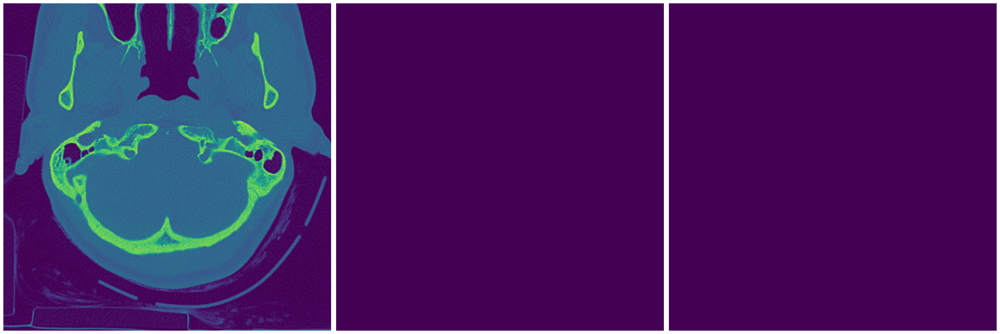

In [35]:
from matplotlib.patches import Rectangle

plt.figure(figsize=(30, 20))
img = exa_image[0][1].cpu().numpy() # 512*512; 0-1;
slice_mask = slice_mask # 512*512; 0or1;
label_mask = exa_mask[:,:,1].astype("uint8") # 512*512; 0-8 classes;
plt.subplot(1, 3, 1); plt.imshow(img); plt.axis('OFF'); # 512*512; 0-1;
plt.subplot(1, 3, 2); plt.imshow(slice_mask); plt.axis('OFF');
plt.subplot(1, 3, 3); 
plt.imshow(exa_mask[:,:,1]); 
plt.axis('OFF');
# plt.subplot(1, 3, 3); plt.imshow(slice_mask); plt.imshow(img,alpha=0.7); plt.axis('OFF');
# # plt.colorbar()
plt.tight_layout()
plt.show()

In [36]:
study_train_df = pd.read_csv(f'{datadir}/train.csv')
print('train_df shape:', study_train_df.shape)
study_train_df.head(3)

train_df shape: (2019, 9)


,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7
0,1.2.826.0.1.3680043.6200,1,1,1,0,0,0,0,0
1,1.2.826.0.1.3680043.27262,1,0,1,0,0,0,0,0
2,1.2.826.0.1.3680043.21561,1,0,1,0,0,0,0,0


In [37]:
seg_paths = glob(f"{datadir}/segmentations/*")
seg_gt_list = [path.split('/')[-1][:-4] for path in seg_paths]
print(len(seg_gt_list))
seg_gt_list[:3]

87


['1.2.826.0.1.3680043.780',
 '1.2.826.0.1.3680043.21321',
 '1.2.826.0.1.3680043.6125']

In [38]:
study_train_df = study_train_df[~study_train_df["StudyInstanceUID"].isin(seg_gt_list)]
study_train_df.shape

(1932, 9)

In [39]:
train_slice_list = []
for file_name in tqdm(study_train_df["StudyInstanceUID"].values):
    train_image_path = glob(f"{datadir}/train_images/{file_name}/*")
    train_image_path = sorted(train_image_path, key=lambda x:int(x.split("/")[-1].replace(".dcm","")))
    for path_idx in range(len(train_image_path)):
        path1 = "nofile" if path_idx-1 < 0 else train_image_path[path_idx-1].replace(f"{datadir}/", "")
        path2 = train_image_path[path_idx].replace(f"{datadir}/", "")
        path3 = "nofile" if path_idx+1 >= len(train_image_path) else train_image_path[path_idx+1].replace(f"{datadir}/", "")
        slice_num = int(path2.split("/")[-1].replace(".dcm",""))
        train_slice_list.append([f"{file_name}_{slice_num}", file_name, slice_num, path1, path2, path3])

100%|██████████| 1932/1932 [00:30<00:00, 62.58it/s]


In [40]:
train_df = pd.DataFrame(train_slice_list, columns=["id", "StudyInstanceUID", "slice_num", "path1", "path2", "path3"])
train_df = train_df.sort_values(['StudyInstanceUID', 'slice_num'], ascending = [True, True]).reset_index(drop=True)
train_df.to_csv(f'kaggle/working/train_slice_list.csv', index=False)
# train_df
train_df=train_df[:200000]
train_df

,id,StudyInstanceUID,slice_num,path1,path2,path3
0,1.2.826.0.1.3680043.10001_1,1.2.826.0.1.3680043.10001,1,nofile,train_images/1.2.826.0.1.3680043.10001/1.dcm,train_images/1.2.826.0.1.3680043.10001/2.dcm
1,1.2.826.0.1.3680043.10001_2,1.2.826.0.1.3680043.10001,2,train_images/1.2.826.0.1.3680043.10001/1.dcm,train_images/1.2.826.0.1.3680043.10001/2.dcm,train_images/1.2.826.0.1.3680043.10001/3.dcm
2,1.2.826.0.1.3680043.10001_3,1.2.826.0.1.3680043.10001,3,train_images/1.2.826.0.1.3680043.10001/2.dcm,train_images/1.2.826.0.1.3680043.10001/3.dcm,train_images/1.2.826.0.1.3680043.10001/4.dcm
3,1.2.826.0.1.3680043.10001_4,1.2.826.0.1.3680043.10001,4,train_images/1.2.826.0.1.3680043.10001/3.dcm,train_images/1.2.826.0.1.3680043.10001/4.dcm,train_images/1.2.826.0.1.3680043.10001/5.dcm
4,1.2.826.0.1.3680043.10001_5,1.2.826.0.1.3680043.10001,5,train_images/1.2.826.0.1.3680043.10001/4.dcm,train_images/1.2.826.0.1.3680043.10001/5.dcm,train_images/1.2.826.0.1.3680043.10001/6.dcm
...,...,...,...,...,...,...
199995,1.2.826.0.1.3680043.18971_10,1.2.826.0.1.3680043.18971,10,train_images/1.2.826.0.1.3680043.18971/9.dcm,train_images/1.2.826.0.1.3680043.18971/10.dcm,train_images/1.2.826.0.1.3680043.18971/11.dcm
199996,1.2.826.0.1.3680043.18971_11,1.2.826.0.1.3680043.18971,11,train_images/1.2.826.0.1.3680043.18971/10.dcm,train_images/1.2.826.0.1.3680043.18971/11.dcm,train_images/1.2.826.0.1.3680043.18971/12.dcm
199997,1.2.826.0.1.3680043.18971_12,1.2.826.0.1.3680043.18971,12,train_images/1.2.826.0.1.3680043.18971/11.dcm,train_images/1.2.826.0.1.3680043.18971/12.dcm,train_images/1.2.826.0.1.3680043.18971/13.dcm
199998,1.2.826.0.1.3680043.18971_13,1.2.826.0.1.3680043.18971,13,train_images/1.2.826.0.1.3680043.18971/12.dcm,train_images/1.2.826.0.1.3680043.18971/13.dcm,train_images/1.2.826.0.1.3680043.18971/14.dcm


In [41]:
class TrainDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
        
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        im2 = load_dicom(f"{datadir}/{row['path2']}")   # 512*512  
        im2h = im2.shape[0]
        im2w = im2.shape[1]

        im1 = load_dicom(f"{datadir}/{row['path1']}") if row['path1'] != "nofile" else np.zeros((im2h, im2w))  # 512*512                                                       
        im3 = load_dicom(f"{datadir}/{row['path3']}") if row['path3'] != "nofile" else np.zeros((im2h, im2w))  # 512*512  

        if im1.shape !=  (im2h, im2w):
            im1 = cv2.resize(im1, (im2w, im2h))
        if im3.shape !=  (im2h, im2w):
            im3 = cv2.resize(im3, (im2w, im2h)) 
        image_list = [im1, im2, im3]
        image = np.stack(image_list, axis=2) # 512*512*3; 0-1

        # transform
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']
        
        # image = image/255.0
        image = np.transpose(image, (2, 0, 1)) # 3*img_size*img_size; 0-1
        return torch.from_numpy(image), row['StudyInstanceUID'], row['slice_num'] 
]


In [42]:
from albumentations import (
    HorizontalFlip, VerticalFlip, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue,
     GaussNoise, MotionBlur, MedianBlur, RandomResizedCrop,
     RandomBrightnessContrast, Flip, OneOf, Compose, Normalize, CoarseDropout, ShiftScaleRotate, 
    CenterCrop, Resize, RandomCrop, GaussianBlur, Downscale, ElasticTransform
)
import albumentations

from albumentations.pytorch import ToTensorV2

def get_transforms(data):
    if data == 'train':
        return Compose([
            Resize(CFG.img_size, CFG.img_size, interpolation=cv2.INTER_NEAREST),
            HorizontalFlip(p=0.5),
            VerticalFlip(p=0.5),
            ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.05, rotate_limit=10, p=0.5),
            OneOf([
                GridDistortion(num_steps=5, distort_limit=0.05, p=1.0),
                OpticalDistortion(distort_limit=0.05, shift_limit=0.05, p=1.0),
                ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=1.0)
            ], p=0.25),
            CoarseDropout(max_holes=8, max_height=CFG.img_size[0]//20, max_width=CFG.img_size[1]//20,
                            min_holes=5, fill_value=0, mask_fill_value=0, p=0.5),
            ], p=1.0)

    elif data == 'light_train':
        return Compose([
            Resize(CFG.img_size, CFG.img_size, interpolation=cv2.INTER_NEAREST),
            HorizontalFlip(p=0.5),
            # VerticalFlip(p=0.5),
            ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.05, rotate_limit=10, p=0.5),
            OneOf([
                GridDistortion(num_steps=5, distort_limit=0.05, p=1.0),
                # OpticalDistortion(distort_limit=0.05, shift_limit=0.05, p=1.0),
                ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=1.0)
            ], p=0.25),
            # CoarseDropout(max_holes=8, max_height=CFG.img_size[0]//20, max_width=CFG.img_size[1]//20,
            #              min_holes=5, fill_value=0, mask_fill_value=0, p=0.5),
            ], p=1.0)
        
    elif data == 'valid':
        return Compose([
            Resize(CFG.img_size, CFG.img_size, interpolation=cv2.INTER_NEAREST),
        ])


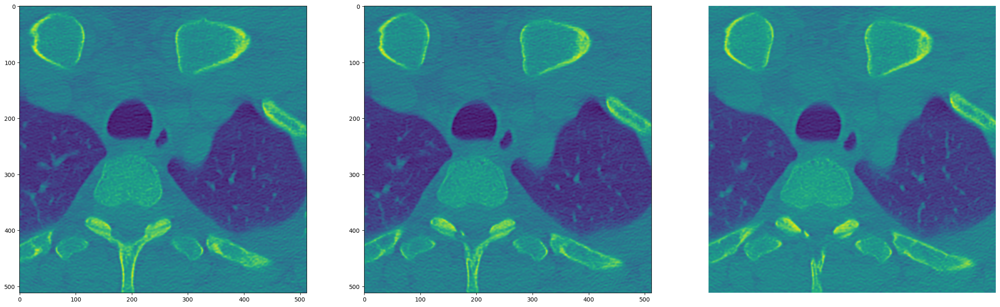

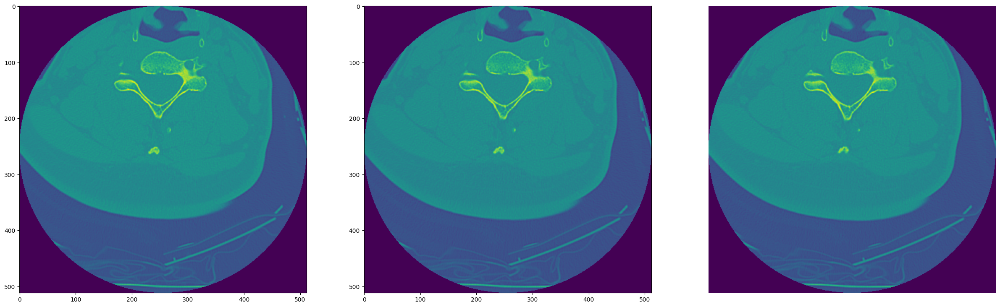

In [43]:
from pylab import rcParams

dataset_show = TrainDataset(
    train_df, 
    get_transforms("valid") # None, get_transforms("train")
    )
rcParams['figure.figsize'] = 30,20
for i in range(2):
    f, axarr = plt.subplots(1,3)
    idx = np.random.randint(0, len(dataset_show))
    img, file_name, n_slice= dataset_show[idx]
    # axarr[p].imshow(img) # transform=None
    axarr[0].imshow(img[0]); plt.axis('OFF');
    axarr[1].imshow(img[1]); plt.axis('OFF');
    axarr[2].imshow(img[2]); plt.axis('OFF');

In [44]:
import segmentation_models_pytorch as smp

def build_model():
    model = smp.Unet(
        encoder_name=CFG.model_arch,    # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
        encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
        in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
        classes=CFG.num_classes,        # model output channels (number of classes in your dataset)
        activation=None,
    )
    model.to(device)
    return model

def load_model(path):
    model = build_model()
    model.load_state_dict(torch.load(path)["model"])
    model.eval()
    return model

In [45]:
os.makedirs(f"{outputdir}/train_voxel", exist_ok=True)
os.makedirs(f"{outputdir}/train_voxel_mask", exist_ok=True)
for filename in train_df["StudyInstanceUID"].values:
    os.makedirs(f"{outputdir}/train_mask/{filename}", exist_ok=True)

In [46]:
slice_class_list = []
voxel_crop_list = []
def crop_voxel(voxel_mask, last_f_name):
    area_thr = 10
    # x
    x_list = []
    length = voxel_mask.shape[0]
    for i in range(length):
        if torch.count_nonzero(voxel_mask[i]).item() >= area_thr:
            x_list.append(i)
            break
    else:
        x_list.append(0)

    for i in range(length-1, -1, -1):
        if torch.count_nonzero(voxel_mask[i]).item() >= area_thr:
            x_list.append(i)
            break
    else:
        x_list.append(length-1)

    # y
    y_list = []
    length = voxel_mask.shape[1]
    for i in range(length):
        if torch.count_nonzero(voxel_mask[:, i]).item() >= area_thr:
            y_list.append(i)
            break
    else:
        y_list.append(0)

    for i in range(length-1, -1, -1):
        if torch.count_nonzero(voxel_mask[:, i]).item() >= area_thr:
            y_list.append(i)
            break
    else:
        y_list.append(length-1)

    # z
    z_list = []
    length = voxel_mask.shape[2]
    for i in range(length):
        if torch.count_nonzero(voxel_mask[:, :, i]).item() >= area_thr:
            z_list.append(i)
            break
    else:
        z_list.append(0)

    for i in range(length-1, -1, -1):
        if torch.count_nonzero(voxel_mask[:, :, i]).item() >= area_thr:
            z_list.append(i)
            break
    else:
        z_list.append(length-1)
    # croped_voxel = voxels[x_list[0]:x_list[1]+1, y_list[0]:y_list[1]+1, z_list[0]:z_list[1]+1]
    try:
        croped_voxel_mask = voxel_mask[x_list[0]:x_list[1]+1, y_list[0]:y_list[1]+1, z_list[0]:z_list[1]+1]
    except:
        print(f"last_f_name:{last_f_name}, voxel_mask.shape:{voxel_mask.shape}, x_list:{x_list}, y_list:{y_list}, z_list:{z_list}")
        x_list = [0, voxel_mask.shape[0]-1]; y_list = [0, voxel_mask.shape[1]-1]; z_list = [0, voxel_mask.shape[2]-1]
        croped_voxel_mask = voxel_mask
    voxel_crop_list.append([last_f_name, voxel_mask.shape[1], x_list[0], x_list[1]+1, y_list[0], y_list[1]+1, z_list[0], z_list[1]+1])

    # croped_voxel = croped_voxel.to('cpu').numpy() # bs*img_size*img_size; 0-8 classes
    croped_voxel_mask = croped_voxel_mask.to('cpu').numpy().astype(np.uint8) # bs*img_size*img_size; 0-8 classes
    for x_idx in range(croped_voxel_mask.shape[0]):
        slice_mask = croped_voxel_mask[x_idx]

        unique, counts = np.unique(slice_mask, return_counts=True)

        if len(unique) == 1 and unique[0] == 0:
            slice_class_list.append([last_f_name, x_idx, x_idx+x_list[0], 0])
        elif unique[0] == 0:
            unique = unique[1:]
            counts = counts[1:]
            slice_class_list.append([last_f_name, x_idx, x_idx+x_list[0]+1, unique[counts.argmax()]])
        else:
            slice_class_list.append([last_f_name, x_idx, x_idx+x_list[0]+1, unique[counts.argmax()]])
        
    return None, croped_voxel_mask

In [47]:
test_dataset = TrainDataset(train_df, transform=get_transforms("valid")) # get_transforms("valid")
test_loader = DataLoader(test_dataset, batch_size=CFG.valid_bs, shuffle=False,  pin_memory=True, drop_last=False)

model = load_model(CFG.weight_path)
model.eval()
last_f_name = ""
voxel_mask = []
# voxels = []
for step, (images, file_names, n_slice) in tqdm(enumerate(test_loader),total=len(test_loader)):
    images = images.to(device, dtype=torch.float) # bs*3*image_size*image_size
    batch_size = images.size(0)
    with torch.no_grad():
        y_pred = model(images) # [B, 8, H, W]
    y_pred = y_pred.sigmoid()
    slice_mask_max = torch.max(y_pred, 1) # bs*img_size*img_size
    slice_mask = torch.where((slice_mask_max.values)>0.5, slice_mask_max.indices+1, 0) # bs*img_size*img_size; 0-8 classes
    slice_mask = torch.where(slice_mask==8,0,slice_mask).type(torch.uint8)
    # slice_mask = slice_mask.to('cpu').numpy().astype(np.uint8) # bs*img_size*img_size; 0-8 classes
    # slice_image = images[:, 1, :, :] # bs*img_size*img_size

    start_idx = 0
    for bs_idx in range(batch_size):
        f_name = file_names[bs_idx]
        if f_name != last_f_name:
            voxel_mask.append(slice_mask[start_idx:bs_idx])
            # voxels.append(slice_image[start_idx:bs_idx])
            voxel_mask = torch.cat(voxel_mask, dim=0) # n_slice*img_size*img_size; 0-8 classes
            # voxels = torch.cat(voxels, dim=0) # n_slice*img_size*img_size
            if len(voxel_mask) > 0:
                croped_voxel, croped_voxel_mask = crop_voxel(voxel_mask, last_f_name)
            last_f_name = f_name
            start_idx = bs_idx
            voxel_mask = []
            # voxels = []
        elif bs_idx == batch_size-1:
            voxel_mask.append(slice_mask[start_idx:batch_size])
            # voxels.append(slice_image[start_idx:batch_size])
voxel_mask = torch.cat(voxel_mask, dim=0)
if len(voxel_mask) > 0:
    croped_voxel, croped_voxel_mask = crop_voxel(voxel_mask, last_f_name)

<ipython-input-44-3ab84549262a>:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path)["model"])
100%|██████████| 6250/6250 [2:16:35<00:00,

In [48]:
# slice_class_list = []
# voxel_crop_list = []
for file_name in tqdm(seg_gt_list):
    ex_path = f"{datadir}/segmentations/{file_name}.nii"
    mask = nib.load(ex_path)
    mask = mask.get_fdata()  # convert to numpy array
    mask = mask[:, ::-1, ::-1].transpose(1, 0, 2)
    mask = np.clip(mask,0,8).astype(np.uint8)
    mask = np.where(mask==8, 0, mask)
    mask = np.ascontiguousarray(mask) # 512*512*slice
    
    if mask.shape[0] != 512 or mask.shape[1] != 512:
        mask = cv2.resize(mask, (512, 512), interpolation=cv2.INTER_NEAREST)
    mask = mask.transpose(2,0,1)
    assert mask.shape[1] == mask.shape[2] == 512
    mask = torch.from_numpy(mask).to(device, dtype=torch.uint8)
    croped_voxel, croped_voxel_mask = crop_voxel(mask, file_name)

100%|██████████| 87/87 [04:59<00:00,  3.44s/it]


In [72]:
voxel_crop_df = pd.read_csv(f"kaggle/working/voxel_crop.csv")
# voxel_crop_df = pd.DataFrame(voxel_crop_list, columns=["StudyInstanceUID", "before_image_size", "x0", "x1", "y0", "y1", "z0", "z1"]).sort_values(by=["StudyInstanceUID"])
# voxel_crop_df.to_csv(f"kaggle/working/voxel_crop.csv", index=False)
voxel_crop_df

,StudyInstanceUID,before_image_size,x0,x1,y0,y1,z0,z1
0,1.2.826.0.1.3680043.10001,512,0,268,0,512,2,512
1,1.2.826.0.1.3680043.10005,512,0,259,0,512,2,512
2,1.2.826.0.1.3680043.10014,512,0,258,0,512,2,512
3,1.2.826.0.1.3680043.10016,512,0,645,0,512,2,512
4,1.2.826.0.1.3680043.10032,512,0,321,0,512,2,512
...,...,...,...,...,...,...,...,...
649,1.2.826.0.1.3680043.8330,512,72,303,103,397,73,419
650,1.2.826.0.1.3680043.8574,512,5,189,154,471,142,394
651,1.2.826.0.1.3680043.8744,512,28,143,27,386,129,416
652,1.2.826.0.1.3680043.8884,512,0,255,60,493,126,471


In [74]:
slice_class_df = pd.read_csv(f"kaggle/working/slice_class.csv")
# slice_class_df = pd.DataFrame(slice_class_list, columns=["StudyInstanceUID", "new_slice_num", "old_slice_num", "vertebra_class"]).sort_values(by=["StudyInstanceUID", "new_slice_num"])
# slice_class_df.to_csv(f"kaggle/working/slice_class.csv", index=False)
slice_class_df

,StudyInstanceUID,new_slice_num,old_slice_num,vertebra_class
0,1.2.826.0.1.3680043.10001,0,1,7
1,1.2.826.0.1.3680043.10001,1,2,7
2,1.2.826.0.1.3680043.10001,2,3,7
3,1.2.826.0.1.3680043.10001,3,4,7
4,1.2.826.0.1.3680043.10001,4,5,7
...,...,...,...,...
219810,1.2.826.0.1.3680043.9926,127,156,7
219811,1.2.826.0.1.3680043.9926,128,157,7
219812,1.2.826.0.1.3680043.9926,129,158,7
219813,1.2.826.0.1.3680043.9926,130,159,7


In [75]:
# study_id_list = []
# slice_num_list = []
# for file_name in tqdm(voxel_crop_df["StudyInstanceUID"].values, total=len(voxel_crop_df)):
#     train_image_path = glob(f"{datadir}/train_images/{file_name}/*")
#     train_image_path = sorted(train_image_path, key=lambda x:int(x.split("/")[-1].replace(".dcm","")))
#     slice_cnt = len(train_image_path)

#     study_id_list.extend([file_name]*slice_cnt)
#     slice_num_list.extend([int(x.split("/")[-1].replace(".dcm","")) for x in train_image_path])
    
# all_slice_df = pd.DataFrame({"StudyInstanceUID":study_id_list, "slice_num":slice_num_list})
# all_slice_df.to_csv(f"kaggle/working/all_slice_df.csv", index=False)
all_slice_df = pd.read_csv(f"kaggle/working/all_slice_df.csv")
print(all_slice_df.shape)
all_slice_df.head(3)

100%|██████████| 654/654 [00:06<00:00, 103.22it/s]


In [76]:
new_df = []
for idx, study_id, _, x0, x1, _, _, _, _, in tqdm(voxel_crop_df.itertuples(), total=len(voxel_crop_df)):
    one_study = all_slice_df[all_slice_df["StudyInstanceUID"] == study_id].reset_index(drop=True)
    new_df.append(one_study[x0:x1])
new_df = pd.concat(new_df, axis=0).reset_index(drop=True)
new_df

100%|██████████| 654/654 [00:09<00:00, 68.18it/s]


,StudyInstanceUID,slice_num
0,1.2.826.0.1.3680043.10001,1
1,1.2.826.0.1.3680043.10001,2
2,1.2.826.0.1.3680043.10001,3
3,1.2.826.0.1.3680043.10001,4
4,1.2.826.0.1.3680043.10001,5
...,...,...
219810,1.2.826.0.1.3680043.9926,156
219811,1.2.826.0.1.3680043.9926,157
219812,1.2.826.0.1.3680043.9926,158
219813,1.2.826.0.1.3680043.9926,159


In [77]:
new_df = new_df.merge(voxel_crop_df, on="StudyInstanceUID", how="left") # merge study_crop_df
display(new_df) 
assert len(slice_class_df) == len(new_df)

,StudyInstanceUID,slice_num,before_image_size,x0,x1,y0,y1,z0,z1
0,1.2.826.0.1.3680043.10001,1,512,0,268,0,512,2,512
1,1.2.826.0.1.3680043.10001,2,512,0,268,0,512,2,512
2,1.2.826.0.1.3680043.10001,3,512,0,268,0,512,2,512
3,1.2.826.0.1.3680043.10001,4,512,0,268,0,512,2,512
4,1.2.826.0.1.3680043.10001,5,512,0,268,0,512,2,512
...,...,...,...,...,...,...,...,...,...
219810,1.2.826.0.1.3680043.9926,156,512,28,160,99,322,122,364
219811,1.2.826.0.1.3680043.9926,157,512,28,160,99,322,122,364
219812,1.2.826.0.1.3680043.9926,158,512,28,160,99,322,122,364
219813,1.2.826.0.1.3680043.9926,159,512,28,160,99,322,122,364


In [78]:
new_slice_df = pd.concat([new_df, slice_class_df[["new_slice_num", "vertebra_class"]]], axis=1)
new_slice_df 

,StudyInstanceUID,slice_num,before_image_size,x0,x1,y0,y1,z0,z1,new_slice_num,vertebra_class
0,1.2.826.0.1.3680043.10001,1,512,0,268,0,512,2,512,0,7
1,1.2.826.0.1.3680043.10001,2,512,0,268,0,512,2,512,1,7
2,1.2.826.0.1.3680043.10001,3,512,0,268,0,512,2,512,2,7
3,1.2.826.0.1.3680043.10001,4,512,0,268,0,512,2,512,3,7
4,1.2.826.0.1.3680043.10001,5,512,0,268,0,512,2,512,4,7
...,...,...,...,...,...,...,...,...,...,...,...
219810,1.2.826.0.1.3680043.9926,156,512,28,160,99,322,122,364,127,7
219811,1.2.826.0.1.3680043.9926,157,512,28,160,99,322,122,364,128,7
219812,1.2.826.0.1.3680043.9926,158,512,28,160,99,322,122,364,129,7
219813,1.2.826.0.1.3680043.9926,159,512,28,160,99,322,122,364,130,7


In [79]:
tr_df = pd.read_csv(f"{datadir}/train.csv")
new_slice_df1 = new_slice_df.merge(tr_df, on="StudyInstanceUID", how="left")
new_slice_df1

,StudyInstanceUID,slice_num,before_image_size,x0,x1,y0,y1,z0,z1,new_slice_num,vertebra_class,patient_overall,C1,C2,C3,C4,C5,C6,C7
0,1.2.826.0.1.3680043.10001,1,512,0,268,0,512,2,512,0,7,0,0,0,0,0,0,0,0
1,1.2.826.0.1.3680043.10001,2,512,0,268,0,512,2,512,1,7,0,0,0,0,0,0,0,0
2,1.2.826.0.1.3680043.10001,3,512,0,268,0,512,2,512,2,7,0,0,0,0,0,0,0,0
3,1.2.826.0.1.3680043.10001,4,512,0,268,0,512,2,512,3,7,0,0,0,0,0,0,0,0
4,1.2.826.0.1.3680043.10001,5,512,0,268,0,512,2,512,4,7,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219810,1.2.826.0.1.3680043.9926,156,512,28,160,99,322,122,364,127,7,1,0,1,0,0,0,0,0
219811,1.2.826.0.1.3680043.9926,157,512,28,160,99,322,122,364,128,7,1,0,1,0,0,0,0,0
219812,1.2.826.0.1.3680043.9926,158,512,28,160,99,322,122,364,129,7,1,0,1,0,0,0,0,0
219813,1.2.826.0.1.3680043.9926,159,512,28,160,99,322,122,364,130,7,1,0,1,0,0,0,0,0


In [80]:
new_slice_df1.to_csv(f"kaggle/working/train_slice.csv", index=False)


In [81]:
sample_num = 24
vertebrae_df_list = []
for study_id in tqdm(np.unique(new_slice_df1["StudyInstanceUID"])):
    one_study = new_slice_df1[new_slice_df1["StudyInstanceUID"] == study_id].reset_index(drop=True)
    for cid in range(1, 8):
        one_study_cid = one_study[one_study["vertebra_class"] == cid].reset_index(drop=True)
        if len(one_study_cid) >= sample_num:
            sample_index = np.linspace(0, len(one_study_cid)-1, sample_num, dtype=int)
            one_study_cid = one_study_cid.iloc[sample_index].reset_index(drop=True)
        if len(one_study_cid) < 1:
            continue
        slice_num_list = one_study_cid["slice_num"].values.tolist()
        arow = one_study_cid.iloc[0]
        vertebrae_df_list.append([f"{study_id}_{cid}", study_id, cid, slice_num_list, arow["before_image_size"], \
            arow["x0"], arow["x1"], arow["y0"], arow["y1"], arow["z0"], arow["z1"], arow[f"C{cid}"]])

100%|██████████| 654/654 [00:11<00:00, 57.85it/s]


In [82]:
len(vertebrae_df_list)/(2019*7)


0.12764451991792258

In [92]:
# vertebrae_df = pd.DataFrame(vertebrae_df_list, columns=["study_cid", "StudyInstanceUID", "cid", "slice_num_list", \
#     "before_image_size", "x0", "x1", "y0", "y1", "z0", "z1", "label"])
# vertebrae_df.to_pickle(f"kaggle/working/vertebrae_df.pkl")    
vertebrae_df = pd.read_pickle(f"kaggle/working/vertebrae_df.pkl")    
vertebrae_df

,study_cid,StudyInstanceUID,cid,slice_num_list,before_image_size,x0,x1,y0,y1,z0,z1,label
0,1.2.826.0.1.3680043.10001_1,1.2.826.0.1.3680043.10001,1,[268],512,0,268,0,512,2,512,0
1,1.2.826.0.1.3680043.10001_7,1.2.826.0.1.3680043.10001,7,"[1, 12, 24, 35, 47, 58, 70, 81, 93, 105, 116, ...",512,0,268,0,512,2,512,0
2,1.2.826.0.1.3680043.10005_1,1.2.826.0.1.3680043.10005,1,[259],512,0,259,0,512,2,512,0
3,1.2.826.0.1.3680043.10005_7,1.2.826.0.1.3680043.10005,7,"[1, 12, 23, 34, 45, 56, 68, 79, 90, 101, 112, ...",512,0,259,0,512,2,512,0
4,1.2.826.0.1.3680043.10014_1,1.2.826.0.1.3680043.10014,1,[258],512,0,258,0,512,2,512,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1799,1.2.826.0.1.3680043.9926_3,1.2.826.0.1.3680043.9926,3,"[75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 8...",512,28,160,99,322,122,364,0
1800,1.2.826.0.1.3680043.9926_4,1.2.826.0.1.3680043.9926,4,"[90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, ...",512,28,160,99,322,122,364,0
1801,1.2.826.0.1.3680043.9926_5,1.2.826.0.1.3680043.9926,5,"[104, 105, 106, 107, 108, 109, 110, 111, 112, ...",512,28,160,99,322,122,364,0
1802,1.2.826.0.1.3680043.9926_6,1.2.826.0.1.3680043.9926,6,"[119, 120, 121, 122, 123, 124, 125, 126, 127, ...",512,28,160,99,322,122,364,0


In [85]:
sample_num = 90
study_df_list = []
for study_id in tqdm(np.unique(new_slice_df1["StudyInstanceUID"])):
    one_study = new_slice_df1[new_slice_df1["StudyInstanceUID"] == study_id].reset_index(drop=True)
    if len(one_study) >= sample_num:
        sample_index = np.linspace(0, len(one_study)-1, sample_num, dtype=int)
        one_study = one_study.iloc[sample_index].reset_index(drop=True)
    slice_num_list = one_study["slice_num"].values.tolist()
    arow = one_study.iloc[0]
    study_df_list.append([study_id, slice_num_list, arow["before_image_size"], arow["x0"], arow["x1"], arow["y0"], arow["y1"], arow["z0"], arow["z1"], arow["patient_overall"]])

100%|██████████| 654/654 [00:09<00:00, 68.47it/s]


In [86]:
len(study_df_list)/(2019)


0.32392273402674593

In [87]:
study_df = pd.DataFrame(study_df_list, columns=["StudyInstanceUID", "slice_num_list", "before_image_size", "x0", "x1", "y0", "y1", "z0", "z1", "label"])
study_df.to_pickle(f"kaggle/working/study_df_{sample_num}.pkl") 
study_df = pd.read_pickle(f"kaggle/working/study_df_90.pkl")    
study_df

,StudyInstanceUID,slice_num_list,before_image_size,x0,x1,y0,y1,z0,z1,label
0,1.2.826.0.1.3680043.10001,"[1, 4, 7, 10, 13, 16, 19, 22, 25, 28, 31, 34, ...",512,0,268,0,512,2,512,0
1,1.2.826.0.1.3680043.10005,"[1, 3, 6, 9, 12, 15, 18, 21, 24, 27, 29, 32, 3...",512,0,259,0,512,2,512,0
2,1.2.826.0.1.3680043.10014,"[1, 3, 6, 9, 12, 15, 18, 21, 24, 26, 29, 32, 3...",512,0,258,0,512,2,512,0
3,1.2.826.0.1.3680043.10016,"[1, 8, 15, 22, 29, 37, 44, 51, 58, 66, 73, 80,...",512,0,645,0,512,2,512,1
4,1.2.826.0.1.3680043.10032,"[1, 4, 8, 11, 15, 18, 22, 26, 29, 33, 36, 40, ...",512,0,321,0,512,2,512,0
...,...,...,...,...,...,...,...,...,...,...
649,1.2.826.0.1.3680043.8330,"[73, 75, 78, 80, 83, 85, 88, 91, 93, 96, 98, 1...",512,72,303,103,397,73,419,1
650,1.2.826.0.1.3680043.8574,"[6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28,...",512,5,189,154,471,142,394,0
651,1.2.826.0.1.3680043.8744,"[29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 4...",512,28,143,27,386,129,416,0
652,1.2.826.0.1.3680043.8884,"[1, 3, 6, 9, 12, 15, 18, 20, 23, 26, 29, 32, 3...",512,0,255,60,493,126,471,0


In [ ]:
# plt.figure(figsize=(30, 20))
# img = images[0].cpu().numpy().transpose(1,2,0)
# plt.subplot(1, 3, 1); plt.imshow(slice_mask); plt.axis('OFF');
# plt.subplot(1, 3, 2); plt.imshow(img); plt.axis('OFF');
# plt.subplot(1, 3, 3); plt.imshow(slice_mask); plt.imshow(img,alpha=0.7); plt.axis('OFF');
# # # plt.colorbar()
# plt.tight_layout()
# plt.show()

In [63]:
train_bs_ = 2
valid_bs_ = 4

In [68]:
class CFG:
    seed=42
    device='GPU'
    nprocs=1 # [1, 8]
    num_workers=num_workers_
    train_bs=train_bs_
    valid_bs=valid_bs_
    # fold_num=5
    fold_num=2

    target_cols=["C1", "C2", "C3", "C4", "C5", "C6", "C7"]
    num_classes=7

    accum_iter=4
    max_grad_norm=1000
    print_freq=100
    normalize_mean=[0.4824, 0.4824, 0.4824] # [0.485, 0.456, 0.406] [0.4824, 0.4824, 0.4824]
    normalize_std=[0.22, 0.22, 0.22] # [0.229, 0.224, 0.225] [0.22, 0.22, 0.22]
    
    suffix="406" 
    fold_list=[0,1,2,3,4] 
    epochs=20
    model_arch="resnest50d" # tf_efficientnetv2_s, resnest50d
    img_size=400
    optimizer="AdamW"
    scheduler="CosineAnnealingLR"
    loss_fn="BCEWithLogitsLoss"
    scheduler_warmup="GradualWarmupSchedulerV3" 

    warmup_epo=1
    warmup_factor = 10
    T_max= epochs-warmup_epo-2 
    
    seq_len = 24
    lr=5e-5
    min_lr=1e-7
    weight_decay=0
    dropout=0.1
    gpu_parallel=False
    n_early_stopping=5
    debug=False
    multihead=False


In [93]:
train_df = pd.read_pickle(f'kaggle/working/vertebrae_df.pkl')
submission_df = pd.read_csv(f'{datadir}/sample_submission.csv')

train_df = train_df[~train_df["StudyInstanceUID"].isin(["1.2.826.0.1.3680043.20574", "1.2.826.0.1.3680043.29952"]) ].reset_index(drop=True)

gkf = GroupKFold(n_splits=CFG.fold_num)
folds = gkf.split(X=train_df, y=None, groups=train_df['StudyInstanceUID'])


train_df

,study_cid,StudyInstanceUID,cid,slice_num_list,before_image_size,x0,x1,y0,y1,z0,z1,label
0,1.2.826.0.1.3680043.10001_1,1.2.826.0.1.3680043.10001,1,[268],512,0,268,0,512,2,512,0
1,1.2.826.0.1.3680043.10001_7,1.2.826.0.1.3680043.10001,7,"[1, 12, 24, 35, 47, 58, 70, 81, 93, 105, 116, ...",512,0,268,0,512,2,512,0
2,1.2.826.0.1.3680043.10005_1,1.2.826.0.1.3680043.10005,1,[259],512,0,259,0,512,2,512,0
3,1.2.826.0.1.3680043.10005_7,1.2.826.0.1.3680043.10005,7,"[1, 12, 23, 34, 45, 56, 68, 79, 90, 101, 112, ...",512,0,259,0,512,2,512,0
4,1.2.826.0.1.3680043.10014_1,1.2.826.0.1.3680043.10014,1,[258],512,0,258,0,512,2,512,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1799,1.2.826.0.1.3680043.9926_3,1.2.826.0.1.3680043.9926,3,"[75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 8...",512,28,160,99,322,122,364,0
1800,1.2.826.0.1.3680043.9926_4,1.2.826.0.1.3680043.9926,4,"[90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, ...",512,28,160,99,322,122,364,0
1801,1.2.826.0.1.3680043.9926_5,1.2.826.0.1.3680043.9926,5,"[104, 105, 106, 107, 108, 109, 110, 111, 112, ...",512,28,160,99,322,122,364,0
1802,1.2.826.0.1.3680043.9926_6,1.2.826.0.1.3680043.9926,6,"[119, 120, 121, 122, 123, 124, 125, 126, 127, ...",512,28,160,99,322,122,364,0


In [94]:
class TrainDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
        
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        study_id = row["StudyInstanceUID"]
        slice_num_list = row['slice_num_list']
        before_image_size = row["before_image_size"]
        y0 = row["y0"]; y1 = row["y1"];
        z0 = row["z0"]; z1 = row["z1"];

        slice_list = []
        for s_num in slice_num_list:
            path = f"{datadir}/train_images/{study_id}/{s_num}.dcm"
            img = load_dicom(path)
            if len(slice_list) == 0:
                imgh = img.shape[0]
                imgw = img.shape[1]
            elif img.shape != (imgh, imgw):
                img = cv2.resize(img,(imgh,imgw))

            slice_list.append(img)
        for _ in range(CFG.seq_len - len(slice_list)):
            slice_list.append(np.zeros((imgh,imgw)))

        image = np.stack(slice_list, axis=2) # 512*512*seq_len; 0-1
        image = cv2.resize(image, (before_image_size, before_image_size))
        image = image[y0:y1, z0:z1, :]

        # transform
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']

        image = np.transpose(image, (2, 0, 1)) # seq_len*img_size*img_size; 0-1

        return torch.from_numpy(image).float(), torch.tensor(row['label']).float()

In [95]:
from albumentations import (
    HorizontalFlip, VerticalFlip, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue,
     GaussNoise, MotionBlur, MedianBlur, RandomResizedCrop,
    RandomBrightnessContrast, Flip, OneOf, Compose, Normalize, CoarseDropout, ShiftScaleRotate, 
    CenterCrop, Resize, RandomCrop, GaussianBlur, Downscale, ElasticTransform
)
import albumentations
from albumentations.pytorch import ToTensorV2

def get_transforms(*, data):
    if data == 'train':
        return Compose([
            RandomResizedCrop(CFG.img_size, CFG.img_size, scale=(0.9, 1), p=1), 
            HorizontalFlip(p=0.5),
            ShiftScaleRotate(p=0.5),
            HueSaturationValue(hue_shift_limit=10, sat_shift_limit=10, val_shift_limit=10, p=0.7),
            RandomBrightnessContrast(brightness_limit=(-0.2,0.2), contrast_limit=(-0.2, 0.2), p=0.7),
            CLAHE(clip_limit=(1,4), p=0.5),
            OneOf([
                OpticalDistortion(distort_limit=1.0),
                GridDistortion(num_steps=5, distort_limit=1.),
                ElasticTransform(alpha=3),
            ], p=0.2),
            OneOf([
                GaussNoise(var_limit=[10, 50]),
                GaussianBlur(),
                MotionBlur(),
                MedianBlur(),
            ], p=0.2),
            Resize(CFG.img_size, CFG.img_size),
            OneOf([
                JpegCompression(),
                Downscale(scale_min=0.1, scale_max=0.15),
            ], p=0.2),
            IAAPiecewiseAffine(p=0.2),
            IAASharpen(p=0.2),
             Cutout(max_h_size=int(CFG.img_size * 0.1), max_w_size=int(CFG.img_size * 0.1), num_holes=5, p=0.5),
            ])
    elif data == 'light_train':
        return Compose([
            Resize(CFG.img_size, CFG.img_size, interpolation=cv2.INTER_NEAREST),
            HorizontalFlip(p=0.5),
            VerticalFlip(p=0.5),
            ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=20, p=0.5),
            OneOf([
                # GaussNoise(),
                GaussianBlur(),
                MotionBlur(),
                # MedianBlur(),
            ], p=0.3),
            OneOf([
                GridDistortion(num_steps=5, distort_limit=0.05, p=1.0),
                OpticalDistortion(distort_limit=0.05, shift_limit=0.05, p=1.0),
                ElasticTransform(alpha=1, sigma=50, alpha_affine=None, p=1.0)
            ], p=0.3),
            # CoarseDropout(max_holes=8, max_height=CFG.img_size[0]//20, max_width=CFG.img_size[1]//20,
            #              min_holes=5, fill_value=0, mask_fill_value=0, p=0.5),
            ], p=1.0)    
    elif data == 'valid':
        return Compose([
            Resize(CFG.img_size, CFG.img_size),
        ])

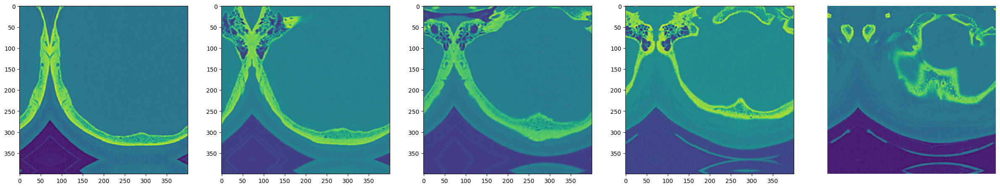

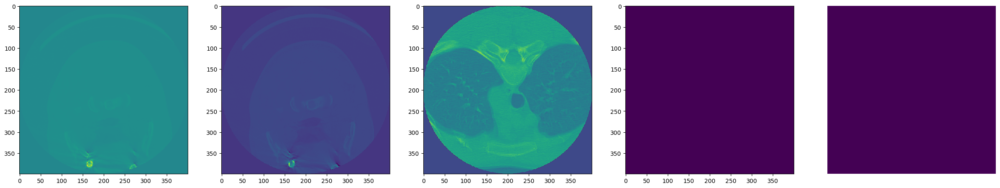

In [96]:
from pylab import rcParams
dataset_show = TrainDataset(
    train_df,
    transform=get_transforms(data='light_train') # None, get_transforms(data='check')
    )
rcParams['figure.figsize'] = 30,20
for i in range(2):
    f, axarr = plt.subplots(1,5)
    idx = np.random.randint(0, len(dataset_show))
    img, label= dataset_show[idx]
    # axarr[p].imshow(img) # transform=None
    axarr[0].imshow(img[0]); plt.axis('OFF');
    axarr[1].imshow(img[1]); plt.axis('OFF');
    axarr[2].imshow(img[2]); plt.axis('OFF');
    axarr[3].imshow(img[3]); plt.axis('OFF');
    axarr[4].imshow(img[4]); plt.axis('OFF');

In [97]:
import torch.nn as nn
from itertools import repeat

class SpatialDropout(nn.Module):
    def __init__(self, drop=0.5):
        super(SpatialDropout, self).__init__()
        self.drop = drop
        
    def forward(self, inputs, noise_shape=None):
        """
        @param: inputs, tensor
        @param: noise_shape, tuple
        """
        outputs = inputs.clone()
        if noise_shape is None:
            noise_shape = (inputs.shape[0], *repeat(1, inputs.dim()-2), inputs.shape[-1]) 
        
        self.noise_shape = noise_shape
        if not self.training or self.drop == 0:
            return inputs
        else:
            noises = self._make_noises(inputs)
            if self.drop == 1:
                noises.fill_(0.0)
            else:
                noises.bernoulli_(1 - self.drop).div_(1 - self.drop)
            noises = noises.expand_as(inputs)    
            outputs.mul_(noises)
            return outputs
            
    def _make_noises(self, inputs):
        return inputs.new().resize_(self.noise_shape)

    
class MLPAttentionNetwork(nn.Module):
 
    def __init__(self, hidden_dim, attention_dim=None):
        super(MLPAttentionNetwork, self).__init__()
 
        self.hidden_dim = hidden_dim
        self.attention_dim = attention_dim
        if self.attention_dim is None:
            self.attention_dim = self.hidden_dim
        # W * x + b
        self.proj_w = nn.Linear(self.hidden_dim, self.attention_dim, bias=True)
        # v.T
        self.proj_v = nn.Linear(self.attention_dim, 1, bias=False)
 
    def forward(self, x):
        """
        :param x: seq_len, batch_size, hidden_dim
        :return: batch_size * seq_len, batch_size * hidden_dim
        """
        # print(f"x shape:{x.shape}")
        batch_size, seq_len, _ = x.size()
        # flat_inputs = x.reshape(-1, self.hidden_dim) # (batch_size*seq_len, hidden_dim)
        # print(f"flat_inputs shape:{flat_inputs.shape}")
        
        H = torch.tanh(self.proj_w(x)) # (batch_size, seq_len, hidden_dim)
        # print(f"H shape:{H.shape}")
        
        att_scores = torch.softmax(self.proj_v(H),axis=1) # (batch_size, seq_len)
        # print(f"att_scores shape:{att_scores.shape}")
        
        attn_x = (x * att_scores).sum(1) # (batch_size, hidden_dim)
        # print(f"attn_x shape:{attn_x.shape}")
        return attn_x

In [98]:
class RSNAClassifier(nn.Module):
    def __init__(self, model_arch, hidden_dim=256, seq_len=24, pretrained=False):
        super().__init__()
        self.seq_len = seq_len
        self.model = timm.create_model(model_arch, in_chans=1, pretrained=pretrained)

        if 'efficientnet' in CFG.model_arch:
            cnn_feature = self.model.classifier.in_features
            self.model.classifier = nn.Identity()
        elif "res" in CFG.model_arch:
            cnn_feature = self.model.fc.in_features
            self.model.global_pool = nn.Identity()
            self.model.fc = nn.Identity()
            self.pooling = nn.AdaptiveAvgPool2d(1)
        
        self.spatialdropout = SpatialDropout(CFG.dropout)
        self.gru = nn.GRU(cnn_feature, hidden_dim, 2, batch_first=True, bidirectional=True)
        self.mlp_attention_layer = MLPAttentionNetwork(2 * hidden_dim)
        self.logits = nn.Sequential(
            nn.Linear(hidden_dim*2, 128),
            nn.ReLU(),
            nn.Dropout(CFG.dropout),
            nn.Linear(128, 1)
        )

    def forward(self, x): # (B, seq_len, H, W)
        bs = x.size(0) 
        x = x.reshape(bs*self.seq_len, 1, x.size(2), x.size(3)) # (B*seq_len, 1, H, W)
        features = self.model(x)   
        if "res" in CFG.model_arch:                             
            features = self.pooling(features).view(bs*self.seq_len, -1) # (B*seq_len, cnn_feature)
        features = self.spatialdropout(features)                # (B*seq_len, cnn_feature)
        # print(features.shape)
        features = features.reshape(bs, self.seq_len, -1)       # (B, seq_len, cnn_feature)
        features, _ = self.gru(features)                        # (B, seq_len, hidden_dim*2)
        atten_out = self.mlp_attention_layer(features)          # (B, hidden_dim*2)
        pred = self.logits(atten_out)                           # (B, 1)
        pred = pred.view(bs, -1)                                # (B, 1)
        return pred

In [99]:
model = RSNAClassifier(CFG.model_arch, hidden_dim=256, seq_len=24, pretrained=True)


model.safetensors:   0%|          | 0.00/110M [00:00<?, ?B/s]

In [100]:
def get_activation(activ_name: str="relu"):
    """"""
    act_dict = {
        "relu": nn.ReLU(inplace=True),
        "tanh": nn.Tanh(),
        "sigmoid": nn.Sigmoid(),
        "identity": nn.Identity()}
    if activ_name in act_dict:
        return act_dict[activ_name]
    else:
        raise NotImplementedError
        

class Conv2dBNActiv(nn.Module):
    """Conv2d -> (BN ->) -> Activation"""
    
    def __init__(
        self, in_channels, out_channels,
        kernel_size, stride, padding,
        bias=False, use_bn=True, activ="relu"
    ):
        """"""
        super(Conv2dBNActiv, self).__init__()
        layers = []
        layers.append(nn.Conv2d(
            in_channels, out_channels,
            kernel_size, stride, padding, bias=bias))
        if use_bn:
            layers.append(nn.BatchNorm2d(out_channels))
            
        layers.append(get_activation(activ))
        self.layers = nn.Sequential(*layers)
        
    def forward(self, x):
        """Forward"""
        return self.layers(x)

class SpatialAttentionBlock(nn.Module):
    """Spatial Attention for (C, H, W) feature maps"""
    
    def __init__(
        self, in_channels,
        out_channels_list,
    ):
        """Initialize"""
        super(SpatialAttentionBlock, self).__init__()
        self.n_layers = len(out_channels_list)
        channels_list = [in_channels] + out_channels_list
        assert self.n_layers > 0
        assert channels_list[-1] == 1
        
        for i in range(self.n_layers - 1):
            in_chs, out_chs = channels_list[i: i + 2]
            layer = Conv2dBNActiv(in_chs, out_chs, 3, 1, 1, activ="relu")
            setattr(self, f"conv{i + 1}", layer)
            
        in_chs, out_chs = channels_list[-2:]
        layer = Conv2dBNActiv(in_chs, out_chs, 3, 1, 1, activ="sigmoid")
        setattr(self, f"conv{self.n_layers}", layer)
    
    def forward(self, x):
        """Forward"""
        h = x
        for i in range(self.n_layers):
            h = getattr(self, f"conv{i + 1}")(h)
            
        h = h * x
        return h

class MultiHeadResNet200D(nn.Module):
    def __init__(self, out_dims_head=[3, 4, 3, 1],  pretrained=False):
        self.base_name = "resnet200d_320"
        self.n_heads = len(out_dims_head)
        super(MultiHeadResNet200D, self).__init__()
        
        # # load base model
        base_model = timm.create_model(self.base_name, num_classes=sum(out_dims_head), pretrained=False)
        in_features = base_model.num_features
        
        if pretrained:
            pretrained_model_path = CFG.student
            state_dict = dict()
            for k, v in torch.load(pretrained_model_path, map_location='cpu')["model"].items():
                if k[:6] == "model.":
                    k = k.replace("model.", "")
                state_dict[k] = v
            base_model.load_state_dict(state_dict)
        
        # # remove global pooling and head classifier
        base_model.reset_classifier(0, '')
        
        # # Shared CNN Bacbone
        self.backbone = base_model
        
        # # Multi Heads.
        for i, out_dim in enumerate(out_dims_head):
            layer_name = f"head_{i}"
            layer = nn.Sequential(
                SpatialAttentionBlock(in_features, [64, 32, 16, 1]),
                nn.AdaptiveAvgPool2d(output_size=1),
                nn.Flatten(start_dim=1),
                nn.Linear(in_features, in_features),
                nn.ReLU(inplace=True),
                nn.Dropout(0.5),
                nn.Linear(in_features, out_dim))
            setattr(self, layer_name, layer)

    def forward(self, x):
        h = self.backbone(x)
        hs = [getattr(self, f"head_{i}")(h) for i in range(self.n_heads)]
        y = torch.cat(hs, axis=1)
        return None, None, y


             
    

In [101]:
def train_one_epoch(train_loader, model, criterion, optimizer, epoch, scheduler, device):
    if CFG.device == 'GPU':
        scaler = GradScaler()
    batch_time = AverageMeter()
    data_time = AverageMeter()
    losses = AverageMeter()
    scores = AverageMeter()
    # switch to train mode
    model.train()
    start = end = time.time()
    for step, (images, labels) in enumerate(train_loader):
        # measure data loading time
        data_time.update(time.time() - end)
        images = images.to(device, dtype=torch.float)
        labels = labels.to(device, dtype=torch.float)
        batch_size = labels.size(0)

        if CFG.device == 'GPU':
            with autocast():
                y_preds = model(images)
                y_preds = y_preds.squeeze(1)
                loss = criterion(y_preds, labels)
            # record loss
            losses.update(loss.item(), batch_size)
            if CFG.accum_iter > 1:
                loss = loss / CFG.accum_iter
            scaler.scale(loss).backward()
            grad_norm = 0 # torch.nn.utils.clip_grad_norm_(model.parameters(), CFG.max_grad_norm)
            if (step + 1) % CFG.accum_iter == 0:
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()
        
        # measure elapsed time
        batch_time.update(time.time() - end)
        end = time.time()

    return losses.avg, optimizer.param_groups[0]["lr"]

In [102]:
def valid_one_epoch(valid_loader, model, criterion, device):
    batch_time = AverageMeter()
    data_time = AverageMeter()
    losses = AverageMeter()
    scores = AverageMeter()
    # switch to evaluation mode
    model.eval()
    trues = []
    preds = []
    start = end = time.time()
    for step, (images, labels) in enumerate(valid_loader):
        # measure data loading time
        data_time.update(time.time() - end)
        images = images.to(device, dtype=torch.float)
        labels = labels.to(device, dtype=torch.float)
        batch_size = labels.size(0)
        # compute loss
        with torch.no_grad():
            y_preds = model(images)
            y_preds = y_preds.squeeze(1)
        loss = criterion(y_preds, labels)
        losses.update(loss.item(), batch_size)
        # record accuracy
        trues.append(labels.to('cpu').numpy())
        preds.append(y_preds.to('cpu').numpy())
        # measure elapsed time
        batch_time.update(time.time() - end)
        end = time.time()

    trues = np.concatenate(trues)
    predictions = np.concatenate(preds)
    print(f"trues.shape: {trues.shape}")
    print(f"predictions.shape: {predictions.shape}")
    score = nn.BCEWithLogitsLoss()(torch.from_numpy(predictions).type(torch.float32), torch.from_numpy(trues).type(torch.float32))
    return losses.avg, predictions, trues, score

In [103]:
class GradualWarmupSchedulerV3(GradualWarmupScheduler):
    def __init__(self, optimizer, multiplier, total_epoch, after_scheduler=None):
        super(GradualWarmupSchedulerV3, self).__init__(optimizer, multiplier, total_epoch, after_scheduler)
    def get_lr(self):
        if self.last_epoch > self.total_epoch:
            if self.after_scheduler:
                if not self.finished:
                    self.after_scheduler.base_lrs = [base_lr * self.multiplier for base_lr in self.base_lrs]
                    self.finished = True
                return self.after_scheduler.get_lr()
            return [base_lr * self.multiplier for base_lr in self.base_lrs]
        if self.multiplier == 1.0:
            return [base_lr * (float(self.last_epoch) / self.total_epoch) for base_lr in self.base_lrs]
        else:
            return [base_lr * ((self.multiplier - 1.) * self.last_epoch / self.total_epoch + 1.) for base_lr in self.base_lrs]

In [104]:
def train_loop(df, fold, trn_idx, val_idx):
    print(f"========== fold: {fold} training ==========")

    # ====================================================
    # loader
    # ====================================================
    train_folds = train_df.loc[trn_idx].reset_index(drop=True)
    valid_folds = train_df.loc[val_idx].reset_index(drop=True)

    train_dataset = TrainDataset(train_folds, transform=get_transforms(data='light_train'))
    valid_dataset = TrainDataset(valid_folds, transform=get_transforms(data='valid'))
    if CFG.device == 'GPU':
        train_loader = DataLoader(train_dataset, batch_size=CFG.train_bs, shuffle=True, num_workers=CFG.num_workers, pin_memory=True, drop_last=True)
        valid_loader = DataLoader(valid_dataset, batch_size=CFG.valid_bs, shuffle=False, num_workers=CFG.num_workers, pin_memory=True, drop_last=False)
    # ====================================================
    # model & optimizer & scheduler & loss
    # ====================================================
    # not checkpoint

    if CFG.multihead:
        model = MultiHeadResNet200D([3, 4, 3, 1], True)
    else:
        model = RSNAClassifier(CFG.model_arch, hidden_dim=256, seq_len=24, pretrained=True)

        
    if CFG.gpu_parallel:    
        num_gpu = torch.cuda.device_count()
        model = DataParallel(model, device_ids=range(num_gpu))
    model.to(device)
    
    
    # optimizer
    if CFG.optimizer == "AdamW":
        if CFG.scheduler_warmup in ["GradualWarmupSchedulerV2","GradualWarmupSchedulerV3"]:
            optimizer = AdamW(model.parameters(), lr=CFG.lr/CFG.warmup_factor, weight_decay=CFG.weight_decay) 
        else:
            optimizer = AdamW(model.parameters(), lr=CFG.lr, weight_decay=CFG.weight_decay)
     # scheduler
    if CFG.scheduler=='ReduceLROnPlateau':
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=CFG.factor, patience=CFG.patience, verbose=True, eps=CFG.eps)
    elif CFG.scheduler=='CosineAnnealingLR':
        scheduler = CosineAnnealingLR(optimizer, T_max=CFG.T_max, eta_min=CFG.min_lr, last_epoch=-1)
    elif CFG.scheduler=='CosineAnnealingWarmRestarts':
        scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=CFG.T_0, T_mult=1, eta_min=CFG.min_lr, last_epoch=-1)

    scheduler_warmup = GradualWarmupSchedulerV3(optimizer, multiplier=CFG.warmup_factor, total_epoch=CFG.warmup_epo, after_scheduler=scheduler)

    # loss
    if CFG.loss_fn == "BCEWithLogitsLoss":
        criterion = nn.BCEWithLogitsLoss()

    # ====================================================
    # loop
    # ====================================================
    valid_acc_max=0; valid_loss_min=float("inf")
    valid_acc_max_cnt=0; valid_loss_min_cnt=0;
    best_acc_epoch=0;


    for epoch in range(CFG.epochs):
        print(f"***** Epoch {epoch} *****")

        if CFG.scheduler_warmup in ["GradualWarmupSchedulerV2","GradualWarmupSchedulerV3"]:
            print(f"schwarmup_last_epoch:{scheduler_warmup.last_epoch}, schwarmup_lr:{scheduler_warmup.get_last_lr()[0]}")
        if CFG.scheduler=='CosineAnnealingLR':
            print(f"scheduler_last_epoch:{scheduler.last_epoch}, scheduler_lr:{scheduler.get_last_lr()[0]}")
        print(f"optimizer_lr:{optimizer.param_groups[0]['lr']}")

                
        start_time = time.time()
        avg_loss, cur_lr = train_one_epoch(train_loader, model, criterion, optimizer, epoch, scheduler, device) # train
        avg_val_loss, preds, trues, score = valid_one_epoch(valid_loader, model, criterion, device) # valid

        # scoring
        elapsed = time.time() - start_time 
        print(f'Epoch {epoch} - avg_train_loss: {avg_loss:.4f}  avg_val_loss: {avg_val_loss:.4f}  time: {elapsed:.0f}s')
        print(f'Epoch {epoch} - valid score: {score:.4f}')
        

        if CFG.scheduler_warmup in ["GradualWarmupSchedulerV2","GradualWarmupSchedulerV3"]:
            scheduler_warmup.step()
        elif CFG.scheduler == "ReduceLROnPlateau":
            scheduler.step(avg_val_loss)
        elif CFG.scheduler in ["CosineAnnealingLR", "CosineAnnealingWarmRestarts"]:
            scheduler.step()

        # early stopping
        if avg_val_loss < valid_loss_min:
            valid_loss_min = avg_val_loss
            valid_loss_min_cnt=0
            best_acc_epoch = epoch
        else:
            valid_loss_min_cnt+=1

        if valid_loss_min_cnt >= CFG.n_early_stopping:
            if CFG.device == 'GPU':
                torch.save({'model': model.state_dict()}, outputdir+f'/{CFG.model_arch}_{CFG.suffix}_fold{fold}_epoch{epoch}.pth')
            print("early_stopping")
            break

        if CFG.device == 'GPU':
            torch.save({'model': model.state_dict()}, outputdir+f'/{CFG.model_arch}_{CFG.suffix}_fold{fold}_epoch{epoch}.pth')
       
    return preds, trues

In [105]:
def main():
    oof_df = pd.DataFrame()
    oof_list = []
    for fold, (trn_idx, val_idx) in enumerate(folds):        
        if fold in CFG.fold_list:
            preds, trues = train_loop(train_df, fold, trn_idx, val_idx)
            oof_list.append([preds, trues])
    return oof_list

In [106]:
if __name__ == '__main__':
    print(CFG.suffix)
    if CFG.device == 'GPU':
        oof_list = main()
        print(oof_list)

406
========== fold: 0 training ==========
***** Epoch 0 *****
schwarmup_last_epoch:0, schwarmup_lr:5e-06
scheduler_last_epoch:0, scheduler_lr:5e-06
optimizer_lr:5e-06


<ipython-input-101-338c4f100c6b>:3: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
<ipython-input-101-338c4f100c6b>:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


trues.shape: (902,)
predictions.shape: (902,)
Epoch 0 - avg_train_loss: 0.5665  avg_val_loss: 0.5047  time: 915s
Epoch 0 - valid score: 0.5047
***** Epoch 1 *****
schwarmup_last_epoch:1, schwarmup_lr:5e-05
scheduler_last_epoch:0, scheduler_lr:5e-06
optimizer_lr:5e-05
trues.shape: (902,)
predictions.shape: (902,)
Epoch 1 - avg_train_loss: 0.4102  avg_val_loss: 0.3705  time: 838s
Epoch 1 - valid score: 0.3705


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:1063: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  _warn_get_lr_called_within_step(self)


***** Epoch 2 *****
schwarmup_last_epoch:2, schwarmup_lr:5e-05
scheduler_last_epoch:0, scheduler_lr:5e-06
optimizer_lr:5e-05
trues.shape: (902,)
predictions.shape: (902,)
Epoch 2 - avg_train_loss: 0.3996  avg_val_loss: 0.3818  time: 839s
Epoch 2 - valid score: 0.3818
***** Epoch 3 *****
schwarmup_last_epoch:2, schwarmup_lr:5e-05
scheduler_last_epoch:1, scheduler_lr:4.957517883711336e-05
optimizer_lr:4.957517883711336e-05
trues.shape: (902,)
predictions.shape: (902,)
Epoch 3 - avg_train_loss: 0.4036  avg_val_loss: 0.3671  time: 839s
Epoch 3 - valid score: 0.3671
***** Epoch 4 *****
schwarmup_last_epoch:2, schwarmup_lr:5e-05
scheduler_last_epoch:2, scheduler_lr:4.831518212363868e-05
optimizer_lr:4.831518212363868e-05
trues.shape: (902,)
predictions.shape: (902,)
Epoch 4 - avg_train_loss: 0.4012  avg_val_loss: 0.3957  time: 837s
Epoch 4 - valid score: 0.3957
***** Epoch 5 *****
schwarmup_last_epoch:2, schwarmup_lr:5e-05
scheduler_last_epoch:3, scheduler_lr:4.6262917536453884e-05
optimizer

<ipython-input-101-338c4f100c6b>:3: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
<ipython-input-101-338c4f100c6b>:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


trues.shape: (902,)
predictions.shape: (902,)
Epoch 0 - avg_train_loss: 0.5296  avg_val_loss: 0.5293  time: 838s
Epoch 0 - valid score: 0.5293
***** Epoch 1 *****
schwarmup_last_epoch:1, schwarmup_lr:5e-05
scheduler_last_epoch:0, scheduler_lr:5e-06
optimizer_lr:5e-05
trues.shape: (902,)
predictions.shape: (902,)
Epoch 1 - avg_train_loss: 0.3795  avg_val_loss: 0.4221  time: 834s
Epoch 1 - valid score: 0.4221


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:1063: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  _warn_get_lr_called_within_step(self)


***** Epoch 2 *****
schwarmup_last_epoch:2, schwarmup_lr:5e-05
scheduler_last_epoch:0, scheduler_lr:5e-06
optimizer_lr:5e-05
trues.shape: (902,)
predictions.shape: (902,)
Epoch 2 - avg_train_loss: 0.3744  avg_val_loss: 0.4517  time: 837s
Epoch 2 - valid score: 0.4517
***** Epoch 3 *****
schwarmup_last_epoch:2, schwarmup_lr:5e-05
scheduler_last_epoch:1, scheduler_lr:4.957517883711336e-05
optimizer_lr:4.957517883711336e-05
trues.shape: (902,)
predictions.shape: (902,)
Epoch 3 - avg_train_loss: 0.3754  avg_val_loss: 0.3998  time: 837s
Epoch 3 - valid score: 0.3998
***** Epoch 4 *****
schwarmup_last_epoch:2, schwarmup_lr:5e-05
scheduler_last_epoch:2, scheduler_lr:4.831518212363868e-05
optimizer_lr:4.831518212363868e-05
trues.shape: (902,)
predictions.shape: (902,)
Epoch 4 - avg_train_loss: 0.3689  avg_val_loss: 0.4062  time: 839s
Epoch 4 - valid score: 0.4062
***** Epoch 5 *****
schwarmup_last_epoch:2, schwarmup_lr:5e-05
scheduler_last_epoch:3, scheduler_lr:4.6262917536453884e-05
optimizer

In [107]:
class CFG:
    seed=42
    device='GPU' # ['TPU', 'GPU']
    nprocs=1 # [1, 8]
    num_workers=2
    valid_bs=32
    fold_num=1 
    
    target_cols=["C1", "C2", "C3", "C4", "C5", "C6", "C7", "OT"]
    num_classes=8 
    
    normalize_mean=[0.4824, 0.4824, 0.4824] 
    normalize_std=[0.22, 0.22, 0.22] 
    
    fold_list=[0]

    model_arch="efficientnet-b0" 
    img_size=512 
    croped_img_size = 320 
    weight_path = f"/kaggle/working/output/efficientnet-b0_109_fold0_epoch13.pth" 
    
# Config device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')    
datadir = "../input/rsna-2022-cervical-spine-fracture-detection"

In [108]:
import pandas as pd

test_df = pd.read_csv(f'{datadir}/test.csv')

debug = False
if len(test_df) == 3:
    debug = True
    
    # Fix mismatch with test_images folder
    data = []
    for i in ['1.2.826.0.1.3680043.22327', '1.2.826.0.1.3680043.25399', '1.2.826.0.1.3680043.5876']:
        for j in ['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'patient_overall']:
            data.append({'row_id': f"{i}_{j}", 'StudyInstanceUID': i, 'prediction_type': j})
    test_df = pd.DataFrame(data)
    
    # Sample submission
    ss = pd.DataFrame(test_df['row_id'])
    ss['fractured'] = 0.5
    print(test_df.shape)


(24, 3)


In [109]:
test_study_list = np.unique(test_df["StudyInstanceUID"].values).tolist()
test_study_list[:3]

['1.2.826.0.1.3680043.22327',
 '1.2.826.0.1.3680043.25399',
 '1.2.826.0.1.3680043.5876']

In [ ]:
# study_id_list = []
# slice_num_list = []
# for study_name in test_study_list:
#     slice_file_list = os.listdir(f"{datadir}/test_images/{study_name}")
#     slice_cnt = len(slice_file_list)
    
#     study_id_list.extend([study_name]*slice_cnt)
#     slice_num_list.extend([int(x.replace(".dcm","")) for x in slice_file_list])
# print(len(study_id_list), len(slice_num_list))

# all_slice_df = pd.DataFrame({"StudyInstanceUID":study_id_list, "slice_num":slice_num_list})
# all_slice_df = all_slice_df.sort_values(["StudyInstanceUID", "slice_num"]).reset_index(drop=True)
# all_slice_df.to_csv(f"./all_slice_df.csv", index=False)
# print(all_slice_df.shape)
# all_slice_df.head(3)

In [110]:
all_slice_list = []
for file_name in test_study_list:
    image_path_list = glob(f"{datadir}/test_images/{file_name}/*")
    image_path_list = sorted(image_path_list, key=lambda x:int(x.split("/")[-1].replace(".dcm","")))
    for path_idx in range(len(image_path_list)):
        path1 = "nofile" if path_idx-1 < 0 else image_path_list[path_idx-1].replace(f"{datadir}/test_images/", "")
        path2 = image_path_list[path_idx].replace(f"{datadir}/test_images/", "")
        path3 = "nofile" if path_idx+1 >= len(image_path_list) else image_path_list[path_idx+1].replace(f"{datadir}/test_images/", "")
        slice_num = int(path2.split("/")[-1].replace(".dcm",""))
        all_slice_list.append([f"{file_name}_{slice_num}", file_name, slice_num, path1, path2, path3])

In [111]:
slice_df = pd.DataFrame(all_slice_list, columns=["id", "StudyInstanceUID", "slice_num", "path1", "path2", "path3"])
slice_df

,id,StudyInstanceUID,slice_num,path1,path2,path3
0,1.2.826.0.1.3680043.22327_1,1.2.826.0.1.3680043.22327,1,nofile,1.2.826.0.1.3680043.22327/1.dcm,1.2.826.0.1.3680043.22327/2.dcm
1,1.2.826.0.1.3680043.22327_2,1.2.826.0.1.3680043.22327,2,1.2.826.0.1.3680043.22327/1.dcm,1.2.826.0.1.3680043.22327/2.dcm,1.2.826.0.1.3680043.22327/3.dcm
2,1.2.826.0.1.3680043.22327_3,1.2.826.0.1.3680043.22327,3,1.2.826.0.1.3680043.22327/2.dcm,1.2.826.0.1.3680043.22327/3.dcm,1.2.826.0.1.3680043.22327/4.dcm
3,1.2.826.0.1.3680043.22327_4,1.2.826.0.1.3680043.22327,4,1.2.826.0.1.3680043.22327/3.dcm,1.2.826.0.1.3680043.22327/4.dcm,1.2.826.0.1.3680043.22327/5.dcm
4,1.2.826.0.1.3680043.22327_5,1.2.826.0.1.3680043.22327,5,1.2.826.0.1.3680043.22327/4.dcm,1.2.826.0.1.3680043.22327/5.dcm,1.2.826.0.1.3680043.22327/6.dcm
...,...,...,...,...,...,...
1313,1.2.826.0.1.3680043.5876_454,1.2.826.0.1.3680043.5876,454,1.2.826.0.1.3680043.5876/453.dcm,1.2.826.0.1.3680043.5876/454.dcm,1.2.826.0.1.3680043.5876/455.dcm
1314,1.2.826.0.1.3680043.5876_455,1.2.826.0.1.3680043.5876,455,1.2.826.0.1.3680043.5876/454.dcm,1.2.826.0.1.3680043.5876/455.dcm,1.2.826.0.1.3680043.5876/456.dcm
1315,1.2.826.0.1.3680043.5876_456,1.2.826.0.1.3680043.5876,456,1.2.826.0.1.3680043.5876/455.dcm,1.2.826.0.1.3680043.5876/456.dcm,1.2.826.0.1.3680043.5876/457.dcm
1316,1.2.826.0.1.3680043.5876_457,1.2.826.0.1.3680043.5876,457,1.2.826.0.1.3680043.5876/456.dcm,1.2.826.0.1.3680043.5876/457.dcm,1.2.826.0.1.3680043.5876/458.dcm


In [112]:
class VoxelDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
        
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        im2 = load_dicom(f"{datadir}/test_images/{row['path2']}")   # 512*512  
        im2h = im2.shape[0]
        im2w = im2.shape[1]

        im1 = load_dicom(f"{datadir}/test_images/{row['path1']}") if row['path1'] != "nofile" else np.zeros((im2h, im2w))  # 512*512                                                       
        im3 = load_dicom(f"{datadir}/test_images/{row['path3']}") if row['path3'] != "nofile" else np.zeros((im2h, im2w))  # 512*512  

        if im1.shape !=  (im2h, im2w):
            im1 = cv2.resize(im1, (im2w, im2h))
        if im3.shape !=  (im2h, im2w):
            im3 = cv2.resize(im3, (im2w, im2h)) 
        image_list = [im1, im2, im3]
        # image = np.stack(image_list, axis=2) # 512*512*3; 0-1
        image = np.stack(image_list, axis=2).astype(np.float32)


        # transform
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']
        
        # image = image/255.0
        image = np.transpose(image, (2, 0, 1)) # 3*img_size*img_size; 0-1
        return torch.from_numpy(image).float(), row['StudyInstanceUID'], row['slice_num'] 

In [113]:
from albumentations import CenterCrop, Resize, RandomCrop, GaussianBlur, Downscale, ElasticTransform, Compose
import albumentations
from albumentations.pytorch import ToTensorV2

def get_transforms(data):
    if data == 'valid':
        return Compose([
            Resize(CFG.img_size, CFG.img_size, interpolation=cv2.INTER_NEAREST),
        ])

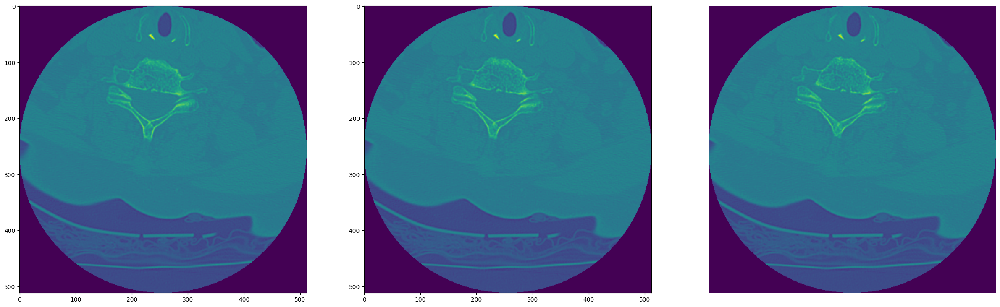

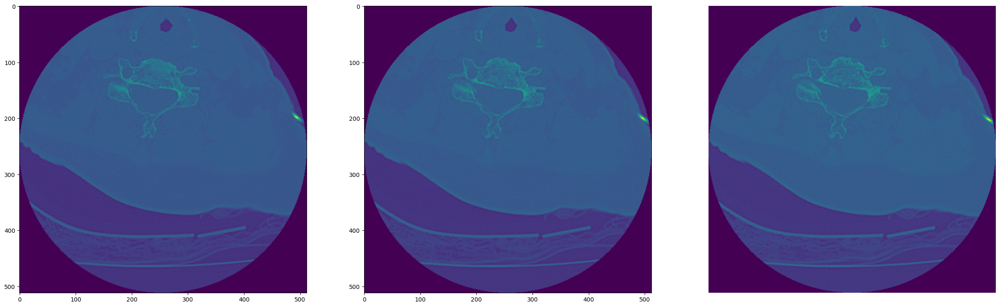

In [114]:
if debug:
    from pylab import rcParams
    dataset_show = VoxelDataset(
        slice_df, 
        get_transforms("valid") # None, get_transforms("train")
        )
    rcParams['figure.figsize'] = 30,20
    for i in range(2):
        f, axarr = plt.subplots(1,3)
        idx = np.random.randint(0, len(dataset_show))
        img, file_name, n_slice= dataset_show[idx]
        # axarr[p].imshow(img) # transform=None
        axarr[0].imshow(img[0]); plt.axis('OFF');
        axarr[1].imshow(img[1]); plt.axis('OFF');
        axarr[2].imshow(img[2]); plt.axis('OFF');

In [115]:
import segmentation_models_pytorch as smp

def build_model():
    model = smp.Unet(
        encoder_name=CFG.model_arch,    # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
        encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
        in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
        classes=CFG.num_classes,        # model output channels (number of classes in your dataset)
        activation=None,
    )
    model.to(device)
    return model

def load_model(path):
    model = build_model()
    model.load_state_dict(torch.load(path)["model"])
    model.eval()
    return model

In [116]:
slice_class_list = []
voxel_crop_list = []
def crop_voxel(voxel_mask, last_f_name):
    area_thr = 10
    # x
    x_list = []
    length = voxel_mask.shape[0]
    for i in range(length):
        if torch.count_nonzero(voxel_mask[i]).item() >= area_thr:
            x_list.append(i)
            break
    else:
        x_list.append(0)

    for i in range(length-1, -1, -1):
        if torch.count_nonzero(voxel_mask[i]).item() >= area_thr:
            x_list.append(i)
            break
    else:
        x_list.append(length-1)

    # y
    y_list = []
    length = voxel_mask.shape[1]
    for i in range(length):
        if torch.count_nonzero(voxel_mask[:, i]).item() >= area_thr:
            y_list.append(i)
            break
    else:
        y_list.append(0)

    for i in range(length-1, -1, -1):
        if torch.count_nonzero(voxel_mask[:, i]).item() >= area_thr:
            y_list.append(i)
            break
    else:
        y_list.append(length-1)

    # z
    z_list = []
    length = voxel_mask.shape[2]
    for i in range(length):
        if torch.count_nonzero(voxel_mask[:, :, i]).item() >= area_thr:
            z_list.append(i)
            break
    else:
        z_list.append(0)

    for i in range(length-1, -1, -1):
        if torch.count_nonzero(voxel_mask[:, :, i]).item() >= area_thr:
            z_list.append(i)
            break
    else:
        z_list.append(length-1)
    # croped_voxel = voxels[x_list[0]:x_list[1]+1, y_list[0]:y_list[1]+1, z_list[0]:z_list[1]+1]
    try:
        croped_voxel_mask = voxel_mask[x_list[0]:x_list[1]+1, y_list[0]:y_list[1]+1, z_list[0]:z_list[1]+1]
    except:
        print(f"last_f_name:{last_f_name}, voxel_mask.shape:{voxel_mask.shape}, x_list:{x_list}, y_list:{y_list}, z_list:{z_list}")
        x_list = [0, voxel_mask.shape[0]-1]; y_list = [0, voxel_mask.shape[1]-1]; z_list = [0, voxel_mask.shape[2]-1]
        croped_voxel_mask = voxel_mask
    voxel_crop_list.append([last_f_name, voxel_mask.shape[1], x_list[0], x_list[1]+1, y_list[0], y_list[1]+1, z_list[0], z_list[1]+1])

    # croped_voxel = croped_voxel.to('cpu').numpy() # bs*img_size*img_size; 0-8 classes
    croped_voxel_mask = croped_voxel_mask.to('cpu').numpy().astype(np.uint8) # bs*img_size*img_size; 0-8 classes
    for x_idx in range(croped_voxel_mask.shape[0]):
        slice_mask = croped_voxel_mask[x_idx]

        unique, counts = np.unique(slice_mask, return_counts=True)
        if len(unique) == 1 and unique[0] == 0:
            slice_class_list.append([last_f_name, x_idx, x_idx+x_list[0], 0])
        elif unique[0] == 0:
            unique = unique[1:]
            counts = counts[1:]
            slice_class_list.append([last_f_name, x_idx, x_idx+x_list[0]+1, unique[counts.argmax()]])
        else:
            slice_class_list.append([last_f_name, x_idx, x_idx+x_list[0]+1, unique[counts.argmax()]])
        
    return None, croped_voxel_mask

In [117]:
test_dataset = VoxelDataset(slice_df, transform=get_transforms("valid")) # get_transforms("valid")
# test_loader = DataLoader(test_dataset, batch_size=CFG.valid_bs, shuffle=False, num_workers=CFG.num_workers, pin_memory=True, drop_last=False)
test_loader = DataLoader(test_dataset, batch_size=CFG.valid_bs, shuffle=False, num_workers=0, pin_memory=True, drop_last=False)

model = load_model(CFG.weight_path)
model.eval()
last_f_name = ""
voxel_mask = []
# voxels = []

<ipython-input-115-3ab84549262a>:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path)["model"])


In [118]:
for step, (images, file_names, n_slice) in tqdm(enumerate(test_loader),total=len(test_loader)):
    print(f"Step: {step}, Images dtype: {images.dtype}")

    images = images.to(device, dtype=torch.float) # bs*3*image_size*image_size
    batch_size = images.size(0)
    with torch.no_grad():
        y_pred = model(images) # [B, 8, H, W]
    y_pred = y_pred.sigmoid()
    slice_mask_max = torch.max(y_pred, 1) # bs*img_size*img_size
    slice_mask = torch.where((slice_mask_max.values)>0.5, slice_mask_max.indices+1, 0) # bs*img_size*img_size; 0-8 classes
    slice_mask = torch.where(slice_mask==8,0,slice_mask).type(torch.uint8)
    # slice_mask = slice_mask.to('cpu').numpy().astype(np.uint8) # bs*img_size*img_size; 0-8 classes
    # slice_image = images[:, 1, :, :] # bs*img_size*img_size

    start_idx = 0
    for bs_idx in range(batch_size):
        f_name = file_names[bs_idx]
        if f_name != last_f_name:
            voxel_mask.append(slice_mask[start_idx:bs_idx])
            # voxels.append(slice_image[start_idx:bs_idx])
            voxel_mask = torch.cat(voxel_mask, dim=0) # n_slice*img_size*img_size; 0-8 classes
            # voxels = torch.cat(voxels, dim=0) # n_slice*img_size*img_size
            if len(voxel_mask) > 0:
                croped_voxel, croped_voxel_mask = crop_voxel(voxel_mask, last_f_name)
            last_f_name = f_name
            start_idx = bs_idx
            voxel_mask = []
            # voxels = []
        elif bs_idx == batch_size-1:
            voxel_mask.append(slice_mask[start_idx:batch_size])
            # voxels.append(slice_image[start_idx:batch_size])
voxel_mask = torch.cat(voxel_mask, dim=0)
if len(voxel_mask) > 0:
    croped_voxel, croped_voxel_mask = crop_voxel(voxel_mask, last_f_name)

  2%|▏         | 1/42 [00:00<00:39,  1.04it/s]

Step: 0, Images dtype: torch.float32


  5%|▍         | 2/42 [00:01<00:39,  1.01it/s]

Step: 1, Images dtype: torch.float32


  7%|▋         | 3/42 [00:02<00:36,  1.06it/s]

Step: 2, Images dtype: torch.float32


 10%|▉         | 4/42 [00:03<00:34,  1.09it/s]

Step: 3, Images dtype: torch.float32


 12%|█▏        | 5/42 [00:04<00:33,  1.10it/s]

Step: 4, Images dtype: torch.float32


 14%|█▍        | 6/42 [00:05<00:32,  1.10it/s]

Step: 5, Images dtype: torch.float32


 17%|█▋        | 7/42 [00:06<00:30,  1.13it/s]

Step: 6, Images dtype: torch.float32


 19%|█▉        | 8/42 [00:07<00:29,  1.15it/s]

Step: 7, Images dtype: torch.float32


 21%|██▏       | 9/42 [00:08<00:29,  1.11it/s]

Step: 8, Images dtype: torch.float32
Step: 9, Images dtype: torch.float32


 26%|██▌       | 11/42 [00:12<00:49,  1.60s/it]

Step: 10, Images dtype: torch.float32


 29%|██▊       | 12/42 [00:14<00:50,  1.68s/it]

Step: 11, Images dtype: torch.float32


 31%|███       | 13/42 [00:16<00:49,  1.71s/it]

Step: 12, Images dtype: torch.float32


 33%|███▎      | 14/42 [00:18<00:49,  1.75s/it]

Step: 13, Images dtype: torch.float32


 36%|███▌      | 15/42 [00:20<00:47,  1.76s/it]

Step: 14, Images dtype: torch.float32


 38%|███▊      | 16/42 [00:21<00:45,  1.76s/it]

Step: 15, Images dtype: torch.float32


 40%|████      | 17/42 [00:23<00:43,  1.74s/it]

Step: 16, Images dtype: torch.float32


 43%|████▎     | 18/42 [00:25<00:42,  1.76s/it]

Step: 17, Images dtype: torch.float32


 45%|████▌     | 19/42 [00:27<00:40,  1.74s/it]

Step: 18, Images dtype: torch.float32


 48%|████▊     | 20/42 [00:28<00:37,  1.72s/it]

Step: 19, Images dtype: torch.float32


 50%|█████     | 21/42 [00:30<00:35,  1.71s/it]

Step: 20, Images dtype: torch.float32


 52%|█████▏    | 22/42 [00:32<00:34,  1.74s/it]

Step: 21, Images dtype: torch.float32


 55%|█████▍    | 23/42 [00:34<00:34,  1.80s/it]

Step: 22, Images dtype: torch.float32


 57%|█████▋    | 24/42 [00:36<00:32,  1.81s/it]

Step: 23, Images dtype: torch.float32


 60%|█████▉    | 25/42 [00:37<00:30,  1.82s/it]

Step: 24, Images dtype: torch.float32


 62%|██████▏   | 26/42 [00:39<00:29,  1.83s/it]

Step: 25, Images dtype: torch.float32
Step: 26, Images dtype: torch.float32


 67%|██████▋   | 28/42 [00:45<00:29,  2.11s/it]

Step: 27, Images dtype: torch.float32


 69%|██████▉   | 29/42 [00:46<00:22,  1.74s/it]

Step: 28, Images dtype: torch.float32


 71%|███████▏  | 30/42 [00:46<00:17,  1.47s/it]

Step: 29, Images dtype: torch.float32


 74%|███████▍  | 31/42 [00:47<00:14,  1.28s/it]

Step: 30, Images dtype: torch.float32


 76%|███████▌  | 32/42 [00:48<00:11,  1.16s/it]

Step: 31, Images dtype: torch.float32


 79%|███████▊  | 33/42 [00:49<00:09,  1.07s/it]

Step: 32, Images dtype: torch.float32


 81%|████████  | 34/42 [00:50<00:07,  1.01it/s]

Step: 33, Images dtype: torch.float32


 83%|████████▎ | 35/42 [00:51<00:06,  1.07it/s]

Step: 34, Images dtype: torch.float32


 86%|████████▌ | 36/42 [00:51<00:05,  1.12it/s]

Step: 35, Images dtype: torch.float32


 88%|████████▊ | 37/42 [00:52<00:04,  1.11it/s]

Step: 36, Images dtype: torch.float32


 90%|█████████ | 38/42 [00:53<00:03,  1.13it/s]

Step: 37, Images dtype: torch.float32


 93%|█████████▎| 39/42 [00:54<00:02,  1.16it/s]

Step: 38, Images dtype: torch.float32


 95%|█████████▌| 40/42 [00:55<00:01,  1.13it/s]

Step: 39, Images dtype: torch.float32


 98%|█████████▊| 41/42 [00:56<00:00,  1.15it/s]

Step: 40, Images dtype: torch.float32
Step: 41, Images dtype: torch.float32


100%|██████████| 42/42 [00:58<00:00,  1.40s/it]


In [119]:
voxel_crop_df = pd.DataFrame(voxel_crop_list, columns=["StudyInstanceUID", "before_image_size", "x0", "x1", "y0", "y1", "z0", "z1"]).sort_values(by=["StudyInstanceUID"])
voxel_crop_df.to_csv(f"voxel_crop.csv", index=False)
print(voxel_crop_df.shape)
voxel_crop_df.head(3)

(3, 8)


,StudyInstanceUID,before_image_size,x0,x1,y0,y1,z0,z1
0,1.2.826.0.1.3680043.22327,512,0,313,0,512,2,512
1,1.2.826.0.1.3680043.25399,512,0,547,0,512,0,512
2,1.2.826.0.1.3680043.5876,512,0,458,0,512,0,512


In [120]:
slice_class_df = pd.DataFrame(slice_class_list, columns=["StudyInstanceUID", "new_slice_num", "old_slice_num", "vertebra_class"]).sort_values(by=["StudyInstanceUID", "new_slice_num"])
slice_class_df.to_csv(f"slice_class.csv", index=False)
print(slice_class_df.shape)
slice_class_df.head(3)

(1318, 4)


,StudyInstanceUID,new_slice_num,old_slice_num,vertebra_class
0,1.2.826.0.1.3680043.22327,0,1,7
1,1.2.826.0.1.3680043.22327,1,2,7
2,1.2.826.0.1.3680043.22327,2,3,7


In [121]:
slice_df


,id,StudyInstanceUID,slice_num,path1,path2,path3
0,1.2.826.0.1.3680043.22327_1,1.2.826.0.1.3680043.22327,1,nofile,1.2.826.0.1.3680043.22327/1.dcm,1.2.826.0.1.3680043.22327/2.dcm
1,1.2.826.0.1.3680043.22327_2,1.2.826.0.1.3680043.22327,2,1.2.826.0.1.3680043.22327/1.dcm,1.2.826.0.1.3680043.22327/2.dcm,1.2.826.0.1.3680043.22327/3.dcm
2,1.2.826.0.1.3680043.22327_3,1.2.826.0.1.3680043.22327,3,1.2.826.0.1.3680043.22327/2.dcm,1.2.826.0.1.3680043.22327/3.dcm,1.2.826.0.1.3680043.22327/4.dcm
3,1.2.826.0.1.3680043.22327_4,1.2.826.0.1.3680043.22327,4,1.2.826.0.1.3680043.22327/3.dcm,1.2.826.0.1.3680043.22327/4.dcm,1.2.826.0.1.3680043.22327/5.dcm
4,1.2.826.0.1.3680043.22327_5,1.2.826.0.1.3680043.22327,5,1.2.826.0.1.3680043.22327/4.dcm,1.2.826.0.1.3680043.22327/5.dcm,1.2.826.0.1.3680043.22327/6.dcm
...,...,...,...,...,...,...
1313,1.2.826.0.1.3680043.5876_454,1.2.826.0.1.3680043.5876,454,1.2.826.0.1.3680043.5876/453.dcm,1.2.826.0.1.3680043.5876/454.dcm,1.2.826.0.1.3680043.5876/455.dcm
1314,1.2.826.0.1.3680043.5876_455,1.2.826.0.1.3680043.5876,455,1.2.826.0.1.3680043.5876/454.dcm,1.2.826.0.1.3680043.5876/455.dcm,1.2.826.0.1.3680043.5876/456.dcm
1315,1.2.826.0.1.3680043.5876_456,1.2.826.0.1.3680043.5876,456,1.2.826.0.1.3680043.5876/455.dcm,1.2.826.0.1.3680043.5876/456.dcm,1.2.826.0.1.3680043.5876/457.dcm
1316,1.2.826.0.1.3680043.5876_457,1.2.826.0.1.3680043.5876,457,1.2.826.0.1.3680043.5876/456.dcm,1.2.826.0.1.3680043.5876/457.dcm,1.2.826.0.1.3680043.5876/458.dcm


In [122]:
new_df = []
for idx, study_id, _, x0, x1, _, _, _, _, in tqdm(voxel_crop_df.itertuples(), total=len(voxel_crop_df)):
    one_study = slice_df[slice_df["StudyInstanceUID"] == study_id][["id", "StudyInstanceUID", "slice_num"]].reset_index(drop=True)
    new_df.append(one_study[x0:x1])
new_df = pd.concat(new_df, axis=0).reset_index(drop=True)
print(new_df.shape)
new_df.head(3)

100%|██████████| 3/3 [00:00<00:00, 610.94it/s]

(1318, 3)


,id,StudyInstanceUID,slice_num
0,1.2.826.0.1.3680043.22327_1,1.2.826.0.1.3680043.22327,1
1,1.2.826.0.1.3680043.22327_2,1.2.826.0.1.3680043.22327,2
2,1.2.826.0.1.3680043.22327_3,1.2.826.0.1.3680043.22327,3


In [123]:
new_df = new_df.merge(voxel_crop_df, on="StudyInstanceUID", how="left") # merge study_crop_df
print(new_df.shape)
display(new_df.head(3))
assert len(slice_class_df) == len(new_df)

(1318, 10)


,id,StudyInstanceUID,slice_num,before_image_size,x0,x1,y0,y1,z0,z1
0,1.2.826.0.1.3680043.22327_1,1.2.826.0.1.3680043.22327,1,512,0,313,0,512,2,512
1,1.2.826.0.1.3680043.22327_2,1.2.826.0.1.3680043.22327,2,512,0,313,0,512,2,512
2,1.2.826.0.1.3680043.22327_3,1.2.826.0.1.3680043.22327,3,512,0,313,0,512,2,512


In [124]:
new_slice_df = pd.concat([new_df, slice_class_df[["new_slice_num", "vertebra_class"]]], axis=1)
print(new_slice_df.shape)
new_slice_df.head(3)

(1318, 12)


,id,StudyInstanceUID,slice_num,before_image_size,x0,x1,y0,y1,z0,z1,new_slice_num,vertebra_class
0,1.2.826.0.1.3680043.22327_1,1.2.826.0.1.3680043.22327,1,512,0,313,0,512,2,512,0,7
1,1.2.826.0.1.3680043.22327_2,1.2.826.0.1.3680043.22327,2,512,0,313,0,512,2,512,1,7
2,1.2.826.0.1.3680043.22327_3,1.2.826.0.1.3680043.22327,3,512,0,313,0,512,2,512,2,7


In [125]:
sample_num = 24
vertebrae_df_list = []
for study_id in tqdm(np.unique(new_slice_df["StudyInstanceUID"])):
    one_study = new_slice_df[new_slice_df["StudyInstanceUID"] == study_id].reset_index(drop=True)
    for cid in range(1, 8):
        one_study_cid = one_study[one_study["vertebra_class"] == cid].reset_index(drop=True)
        if len(one_study_cid) >= sample_num:
            sample_index = np.linspace(0, len(one_study_cid)-1, sample_num, dtype=int)
            one_study_cid = one_study_cid.iloc[sample_index].reset_index(drop=True)
        if len(one_study_cid) < 5:
            continue
        slice_num_list = one_study_cid["slice_num"].values.tolist()
        arow = one_study_cid.iloc[0]
        vertebrae_df_list.append([f"{study_id}_{cid}", study_id, cid, slice_num_list, arow["before_image_size"], \
            arow["x0"], arow["x1"], arow["y0"], arow["y1"], arow["z0"], arow["z1"]])

100%|██████████| 3/3 [00:00<00:00, 225.15it/s]


In [126]:
vertebrae_df = pd.DataFrame(vertebrae_df_list, columns=["study_cid", "StudyInstanceUID", "cid", "slice_num_list", \
    "before_image_size", "x0", "x1", "y0", "y1", "z0", "z1" ])
vertebrae_df.to_pickle(f"vertebrae_df.pkl")    
print(vertebrae_df.shape) #
vertebrae_df.head(3)

(3, 11)


,study_cid,StudyInstanceUID,cid,slice_num_list,before_image_size,x0,x1,y0,y1,z0,z1
0,1.2.826.0.1.3680043.22327_7,1.2.826.0.1.3680043.22327,7,"[1, 14, 28, 41, 55, 68, 82, 95, 109, 122, 136,...",512,0,313,0,512,2,512
1,1.2.826.0.1.3680043.25399_1,1.2.826.0.1.3680043.25399,1,"[1, 24, 48, 72, 95, 119, 143, 167, 190, 214, 2...",512,0,547,0,512,0,512
2,1.2.826.0.1.3680043.5876_7,1.2.826.0.1.3680043.5876,7,"[1, 20, 40, 60, 80, 100, 119, 139, 159, 179, 1...",512,0,458,0,512,0,512


In [127]:
train_df = vertebrae_df
CFG.img_size = 384
CFG.valid_bs = 14
CFG.seq_len = 24
CFG.dropout=0.1
CFG.gpu_parallel=False
# tf_efficientnetv2_s, resnest50d
CFG.archs_list=[
    # "tf_efficientnetv2_s",
    # "tf_efficientnetv2_s",
    # "efficientnet_b0",
    # "efficientnet_b0",
    # "resnest50d",
    "resnest50d",
] 
CFG.weights_list = [
    # "/kaggle/working/output/efficientnet-b0_109_fold0_epoch13.pth",
    # "../input/loadmodel/tf_efficientnetv2_s_405_fold1_epoch9.pth",
    
    "/kaggle/working/output/resnest50d_406_fold0_epoch10.pth",
    # "../input/loadmodel/resnest50d_406_fold1_epoch15.pth",
]
CFG.fillna_number = 0.10


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [128]:
class TestDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
        
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        study_id = row["StudyInstanceUID"]
        slice_num_list = row['slice_num_list']
        before_image_size = row["before_image_size"]
        y0 = row["y0"]; y1 = row["y1"];
        z0 = row["z0"]; z1 = row["z1"];

        slice_list = []
        for s_num in slice_num_list:
            path = f"{datadir}/test_images/{study_id}/{s_num}.dcm"
            img = load_dicom(path)
            if len(slice_list) == 0:
                imgh = img.shape[0]
                imgw = img.shape[1]
            elif img.shape != (imgh, imgw):
                img = cv2.resize(img,(imgh,imgw))

            slice_list.append(img)
        for _ in range(CFG.seq_len - len(slice_list)):
            slice_list.append(np.zeros((imgh,imgw)))

        image = np.stack(slice_list, axis=2) # 512*512*seq_len; 0-1
        image = cv2.resize(image, (before_image_size, before_image_size))
        image = image[y0:y1, z0:z1, :]

        # transform
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']

        image = np.transpose(image, (2, 0, 1)) # seq_len*img_size*img_size; 0-1
        return torch.from_numpy(image)

In [129]:
from albumentations import Resize, RandomCrop
import albumentations
from albumentations.pytorch import ToTensorV2

def get_transforms(*, data):
    if data == 'valid':
        return Compose([
            Resize(CFG.img_size, CFG.img_size),
        ])

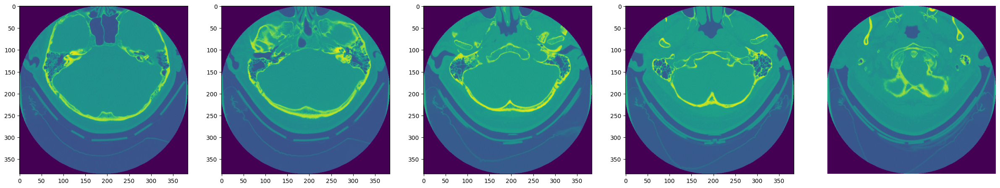

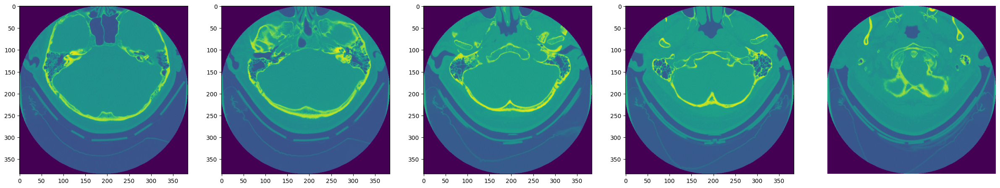

In [130]:
from pylab import rcParams
dataset_show = TestDataset(
    train_df,
    transform=get_transforms(data='valid') # None, get_transforms(data='check')
    )
rcParams['figure.figsize'] = 30,20
for i in range(2):
    f, axarr = plt.subplots(1,5)
    idx = np.random.randint(0, len(dataset_show))
    img = dataset_show[idx]
    # axarr[p].imshow(img) # transform=None
    axarr[0].imshow(img[0]); plt.axis('OFF');
    axarr[1].imshow(img[1]); plt.axis('OFF');
    axarr[2].imshow(img[2]); plt.axis('OFF');
    axarr[3].imshow(img[3]); plt.axis('OFF');
    axarr[4].imshow(img[4]); plt.axis('OFF');

In [131]:
import torch.nn as nn
from itertools import repeat

class SpatialDropout(nn.Module):
    def __init__(self, drop=0.5):
        super(SpatialDropout, self).__init__()
        self.drop = drop
        
    def forward(self, inputs, noise_shape=None):
        """
        @param: inputs, tensor
        @param: noise_shape, tuple
        """
        outputs = inputs.clone()
        if noise_shape is None:
            noise_shape = (inputs.shape[0], *repeat(1, inputs.dim()-2), inputs.shape[-1]) 
        
        self.noise_shape = noise_shape
        if not self.training or self.drop == 0:
            return inputs
        else:
            noises = self._make_noises(inputs)
            if self.drop == 1:
                noises.fill_(0.0)
            else:
                noises.bernoulli_(1 - self.drop).div_(1 - self.drop)
            noises = noises.expand_as(inputs)    
            outputs.mul_(noises)
            return outputs
            
    def _make_noises(self, inputs):
        return inputs.new().resize_(self.noise_shape)


    
class MLPAttentionNetwork(nn.Module):
 
    def __init__(self, hidden_dim, attention_dim=None):
        super(MLPAttentionNetwork, self).__init__()
 
        self.hidden_dim = hidden_dim
        self.attention_dim = attention_dim
        if self.attention_dim is None:
            self.attention_dim = self.hidden_dim
        # W * x + b
        self.proj_w = nn.Linear(self.hidden_dim, self.attention_dim, bias=True)
        # v.T
        self.proj_v = nn.Linear(self.attention_dim, 1, bias=False)
 
    def forward(self, x):
        """
        :param x: seq_len, batch_size, hidden_dim
        :return: batch_size * seq_len, batch_size * hidden_dim
        """
        # print(f"x shape:{x.shape}")
        batch_size, seq_len, _ = x.size()
        # flat_inputs = x.reshape(-1, self.hidden_dim) # (batch_size*seq_len, hidden_dim)
        # print(f"flat_inputs shape:{flat_inputs.shape}")
        
        H = torch.tanh(self.proj_w(x)) # (batch_size, seq_len, hidden_dim)
        # print(f"H shape:{H.shape}")
        
        att_scores = torch.softmax(self.proj_v(H),axis=1) # (batch_size, seq_len)
        # print(f"att_scores shape:{att_scores.shape}")
        
        attn_x = (x * att_scores).sum(1) # (batch_size, hidden_dim)
        # print(f"attn_x shape:{attn_x.shape}")
        return attn_x

In [132]:
class RSNAClassifier(nn.Module):
    def __init__(self, model_arch, hidden_dim=256, seq_len=24, pretrained=False):
        super().__init__()
        self.seq_len = seq_len
        self.model = timm.create_model(model_arch, in_chans=1, pretrained=False)
        self.model_arch = model_arch

        if 'efficientnet' in self.model_arch:
            cnn_feature = self.model.classifier.in_features
            self.model.classifier = nn.Identity()
        elif "res" in self.model_arch:
            cnn_feature = self.model.fc.in_features
            self.model.global_pool = nn.Identity()
            self.model.fc = nn.Identity()
            self.pooling = nn.AdaptiveAvgPool2d(1)
        
        self.spatialdropout = SpatialDropout(CFG.dropout)
        self.gru = nn.GRU(cnn_feature, hidden_dim, 2, batch_first=True, bidirectional=True)
        self.mlp_attention_layer = MLPAttentionNetwork(2 * hidden_dim)
        self.logits = nn.Sequential(
            nn.Linear(hidden_dim*2, 128),
            nn.ReLU(),
            nn.Dropout(CFG.dropout),
            nn.Linear(128, 1)
        )

    def forward(self, x): # (B, seq_len, H, W)
        bs = x.size(0) 
        x = x.reshape(bs*self.seq_len, 1, x.size(2), x.size(3)) # (B*seq_len, 1, H, W)
        features = self.model(x)   
        if "res" in self.model_arch:                             
            features = self.pooling(features).view(bs*self.seq_len, -1) # (B*seq_len, cnn_feature)
        features = self.spatialdropout(features)                # (B*seq_len, cnn_feature)
        # print(features.shape)
        features = features.reshape(bs, self.seq_len, -1)       # (B, seq_len, cnn_feature)
        features, _ = self.gru(features)                        # (B, seq_len, hidden_dim*2)
        atten_out = self.mlp_attention_layer(features)          # (B, hidden_dim*2)
        pred = self.logits(atten_out)                           # (B, 1)
        pred = pred.view(bs, -1)                                # (B, 1)
        return pred

In [133]:
test_dataset = TestDataset(train_df, transform=get_transforms(data='valid'))
test_loader = DataLoader(test_dataset, batch_size=CFG.valid_bs, shuffle=False, num_workers=CFG.num_workers, pin_memory=True, drop_last=False)

cls_model_list = []
for m_arch, m_weight  in zip(CFG.archs_list, CFG.weights_list):
    model = RSNAClassifier(m_arch, hidden_dim=256, seq_len=24, pretrained=False)
    model.to(device)
    model.load_state_dict(torch.load(m_weight)["model"])
    model.eval()
    cls_model_list.append(model)

<ipython-input-133-91451f9197ae>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(m_weight)["model"])


In [134]:
len(cls_model_list)


1

In [135]:
all_preds = []
for step, (images) in tqdm(enumerate(test_loader), total=len(test_loader)):
    images = images.to(device, dtype=torch.float) # study-cid:24*img_sz*img_sz
    models_preds = []
    for model in cls_model_list:
        with torch.no_grad(): 
            y_preds = model(images) # (B, 1)
            y_preds = y_preds.squeeze(1)
            models_preds.append(y_preds.sigmoid().to('cpu').numpy()) # list,len=model_nums,np(batch)
    models_preds = np.mean(models_preds, axis=0) # batch, one sample preds
    all_preds.append(models_preds)    
all_preds = np.concatenate(all_preds)

100%|██████████| 1/1 [00:21<00:00, 21.87s/it]


In [136]:
train_df["fractured"] = all_preds
model_preds_df = train_df[["StudyInstanceUID", "cid", "fractured"]]
print(model_preds_df.shape)
model_preds_df.head()

(3, 3)


,StudyInstanceUID,cid,fractured
0,1.2.826.0.1.3680043.22327,7,0.217805
1,1.2.826.0.1.3680043.25399,1,0.297411
2,1.2.826.0.1.3680043.5876,7,0.216720


In [137]:
def type_to_num(x):
    type_dict = {
        "C1":1,
        "C2":2,
        "C3":3,
        "C4":4,
        "C5":5,
        "C6":6,
        "C7":7,
        "patient_overall":8,
    }
    return type_dict[x]

test_df["cid"] = test_df["prediction_type"].apply(type_to_num)
print(test_df.shape)
test_df.head(8)

(24, 4)


,row_id,StudyInstanceUID,prediction_type,cid
0,1.2.826.0.1.3680043.22327_C1,1.2.826.0.1.3680043.22327,C1,1
1,1.2.826.0.1.3680043.22327_C2,1.2.826.0.1.3680043.22327,C2,2
2,1.2.826.0.1.3680043.22327_C3,1.2.826.0.1.3680043.22327,C3,3
3,1.2.826.0.1.3680043.22327_C4,1.2.826.0.1.3680043.22327,C4,4
4,1.2.826.0.1.3680043.22327_C5,1.2.826.0.1.3680043.22327,C5,5
5,1.2.826.0.1.3680043.22327_C6,1.2.826.0.1.3680043.22327,C6,6
6,1.2.826.0.1.3680043.22327_C7,1.2.826.0.1.3680043.22327,C7,7
7,1.2.826.0.1.3680043.22327_patient_overall,1.2.826.0.1.3680043.22327,patient_overall,8


In [138]:
test_df = test_df.merge(model_preds_df, how="left", on=["StudyInstanceUID", "cid"])
test_df["fractured"] = test_df["fractured"].fillna(CFG.fillna_number)
print(test_df.shape)
test_df.head(8)

(24, 5)


,row_id,StudyInstanceUID,prediction_type,cid,fractured
0,1.2.826.0.1.3680043.22327_C1,1.2.826.0.1.3680043.22327,C1,1,0.100000
1,1.2.826.0.1.3680043.22327_C2,1.2.826.0.1.3680043.22327,C2,2,0.100000
2,1.2.826.0.1.3680043.22327_C3,1.2.826.0.1.3680043.22327,C3,3,0.100000
3,1.2.826.0.1.3680043.22327_C4,1.2.826.0.1.3680043.22327,C4,4,0.100000
4,1.2.826.0.1.3680043.22327_C5,1.2.826.0.1.3680043.22327,C5,5,0.100000
5,1.2.826.0.1.3680043.22327_C6,1.2.826.0.1.3680043.22327,C6,6,0.100000
6,1.2.826.0.1.3680043.22327_C7,1.2.826.0.1.3680043.22327,C7,7,0.217805
7,1.2.826.0.1.3680043.22327_patient_overall,1.2.826.0.1.3680043.22327,patient_overall,8,0.100000


In [139]:
for study_id in test_study_list:
    overall_fractured = test_df[test_df["StudyInstanceUID"]==study_id]["fractured"][:7].agg(lambda x:1-((1-x).prod()))
    test_df.loc[((test_df["StudyInstanceUID"]==study_id) & (test_df["prediction_type"]=="patient_overall")), "fractured"] = overall_fractured
print(test_df.shape)
test_df

(24, 5)


,row_id,StudyInstanceUID,prediction_type,cid,fractured
0,1.2.826.0.1.3680043.22327_C1,1.2.826.0.1.3680043.22327,C1,1,0.100000
1,1.2.826.0.1.3680043.22327_C2,1.2.826.0.1.3680043.22327,C2,2,0.100000
2,1.2.826.0.1.3680043.22327_C3,1.2.826.0.1.3680043.22327,C3,3,0.100000
3,1.2.826.0.1.3680043.22327_C4,1.2.826.0.1.3680043.22327,C4,4,0.100000
4,1.2.826.0.1.3680043.22327_C5,1.2.826.0.1.3680043.22327,C5,5,0.100000
5,1.2.826.0.1.3680043.22327_C6,1.2.826.0.1.3680043.22327,C6,6,0.100000
6,1.2.826.0.1.3680043.22327_C7,1.2.826.0.1.3680043.22327,C7,7,0.217805
7,1.2.826.0.1.3680043.22327_patient_overall,1.2.826.0.1.3680043.22327,patient_overall,8,0.584309
8,1.2.826.0.1.3680043.25399_C1,1.2.826.0.1.3680043.25399,C1,1,0.297411
9,1.2.826.0.1.3680043.25399_C2,1.2.826.0.1.3680043.25399,C2,2,0.100000
